In [ ]:
!nvidia-smi -L

GPU 0: Tesla K80 (UUID: GPU-30dc403f-46aa-af23-ee07-8ff6fa85038b)


In this lab, we will train a traditional VGG16 model, where we will train the last couple of layers to adapt it to our problem.

First, we load the data.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# New Section

In [ ]:
!wget "https://uwoca-my.sharepoint.com/:u:/g/personal/cbravoro_uwo_ca/Ea8hL1Qqz-1DqXPUkFg3_OkBkT_oOJ5EdvwX1YU_afWF1w?download=1"

--2021-12-16 23:47:47--  https://uwoca-my.sharepoint.com/:u:/g/personal/cbravoro_uwo_ca/Ea8hL1Qqz-1DqXPUkFg3_OkBkT_oOJ5EdvwX1YU_afWF1w?download=1
Resolving uwoca-my.sharepoint.com (uwoca-my.sharepoint.com)... 13.107.136.9, 13.107.138.9
Connecting to uwoca-my.sharepoint.com (uwoca-my.sharepoint.com)|13.107.136.9|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/cbravoro_uwo_ca/Documents/Clases/Western/FM%209528A%20Banking%20Analytics/2021/Coursework%203%20-%20Deep%20Learning/LiDARTiles.tar.gz [following]
--2021-12-16 23:47:47--  https://uwoca-my.sharepoint.com/personal/cbravoro_uwo_ca/Documents/Clases/Western/FM%209528A%20Banking%20Analytics/2021/Coursework%203%20-%20Deep%20Learning/LiDARTiles.tar.gz
Reusing existing connection to uwoca-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 3115530847 (2.9G) [application/x-gzip]
Saving to: ‘Ea8hL1Qqz-1DqXPUkFg3_OkBkT_oOJ5EdvwX1YU_afWF1w?download=1’

Ea8hL1Qqz-1DqXPUkFg 100%[=

In [ ]:
!mv /content/Ea8hL1Qqz-1DqXPUkFg3_OkBkT_oOJ5EdvwX1YU_afWF1w?download=1 /content/data.tar.gz

In [ ]:
!tar xvzf data.tar.gz

Let's see a couple of examples.

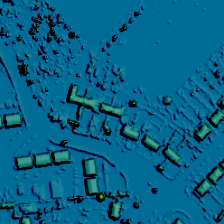

In [ ]:
from IPython.display import Image
Image(filename='LIDAR/LIDAR_17538.png') 

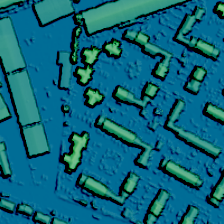

In [ ]:
Image(filename='LIDAR/LIDAR_31664.png') 

In [ ]:
import pandas as pd

In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/EmbeddingData_C3_9528.csv')#, sheet_name = "EmbeddingData_C3_9528")
df1#.head()

,id,LSOA11CD,LSOA11NM,SOAC11CD,SOAC11NM,MSOA11CD,MSOA11NM,LAD17CD,LAD17NM,LACCD,LACNM,income,employment,education,health,crime,barriers,living_environment
0,48552,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,0.025,0.042,7.632,-1.345,-0.139,30.886,13.902
1,46571,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,0.025,0.042,7.632,-1.345,-0.139,30.886,13.902
2,21161,E01000487,Brent 006E,7b,Young ethnic communities,E02000098,Brent 006,E09000005,Brent,4a1r,Ethnically Diverse Metropolitan Living,0.123,0.068,7.192,-0.782,0.109,40.432,21.233
3,26188,E01004572,Wandsworth 016A,6a,Inner city cosmopolitan,E02000938,Wandsworth 016,E09000032,Wandsworth,5a1r,London Cosmopolitan,0.142,0.090,8.750,-0.328,1.062,35.035,21.583
4,46276,E01033320,Lewisham 017E,6a,Inner city cosmopolitan,E02000669,Lewisham 017,E09000023,Lewisham,4a1r,Ethnically Diverse Metropolitan Living,0.125,0.105,7.185,-0.143,0.133,32.410,38.222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36718,35116,E01003162,Lambeth 022E,6a,Inner city cosmopolitan,E02000639,Lambeth 022,E09000022,Lambeth,5a1r,London Cosmopolitan,0.193,0.108,25.952,0.259,0.093,29.343,32.090
36719,19453,E01001226,Ealing 019C,6a,Inner city cosmopolitan,E02000256,Ealing 019,E09000009,Ealing,4a1r,Ethnically Diverse Metropolitan Living,0.078,0.058,1.939,-0.225,-0.610,36.113,23.364
36720,27624,E01000491,Brent 030B,6a,Inner city cosmopolitan,E02000122,Brent 030,E09000005,Brent,4a1r,Ethnically Diverse Metropolitan Living,0.133,0.089,9.526,-0.438,0.441,39.773,22.605
36721,6327,E01002446,Hillingdon 031B,7a,Urban cultural mix,E02000524,Hillingdon 031,E09000017,Hillingdon,4a1r,Ethnically Diverse Metropolitan Living,0.086,0.064,21.986,-0.194,1.286,32.287,28.307


In [ ]:
df1["income"] = df1["income"]*100

## VGG16

The VGG 16 model is a classic model in Deep Learning. It is a 16 layer model, following the structure that we discussed in the lectures.

This model was trained over the ImageNet data, thus looking to classify among 1000 different types of objects, over a very large database of images. We can leverage these already-trained weights, and  adapt just the last few layers for our purposes.

We start by loading the VGG16 model. Keras comes pre-packaged with a series of models, loaded into the [Applications library](https://keras.io/applications/). We start by first loading the model on-the-fly using the library. We can check the options of the model in the options of the function [VGG16](https://keras.io/applications/#vgg16).

We also need a package that allows for an efficient storage of the model using a binary format. The package is called [h5py](https://www.h5py.org/) and also allows for storing your pre-trained models. You can read a tutorial for this [here](https://machinelearningmastery.com/save-load-keras-deep-learning-models/).

In [ ]:
import numpy as np
import h5py as h5py
import PIL

# Others
import numpy as np
from sklearn.model_selection import train_test_split

# For AUC estimation and ROC plots
from sklearn.metrics import roc_curve, auc

# Plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
model = VGG16(weights = 'imagenet',      # The weights from the ImageNet competition
              include_top = False,       # Do not include the top layer, which classifies.
              input_shape= (224, 224, 3) # Input shape. Three channels, and BGR (NOT RGB!!!)
             )

58900480/58889256 [==============================] - 1s 0us/step


This will download the model and save it to our unoriginally named variable model. It is a pretty beefy download, at around 500MB. Luckly we have fast internet in the lab :)

We can now check the details of the model as usual.

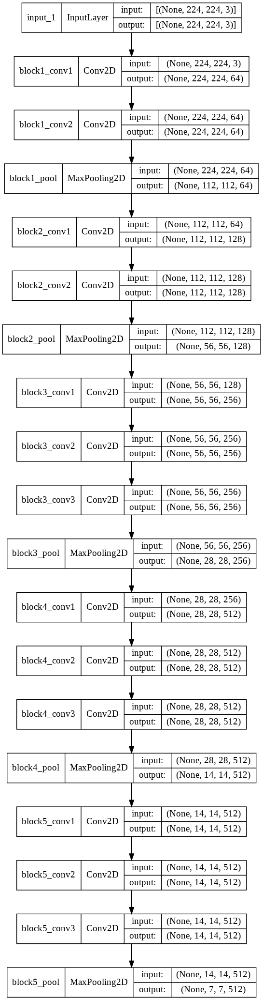

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(model, show_shapes=True, show_layer_names=True, to_file='GraphModel.png')
Image(retina=True, filename='GraphModel.png')

At this point, every single parameter is trainable. We don't need this, as we want to use the parameters that come with the model. We will create a parallel model to store the new trainable layers, and then set all of these layers as untrainable. We will finally add a Dense layer with 128 neurons, plus a Dense layer with two classes.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *

In [ ]:
# Create new model
CBModel = Sequential()

# Copy the layers to our new model. This needs to be done as there is a bug in Keras.
for layer in model.layers:
    CBModel.add(layer)

# Set the layers as untrainable
for layer in CBModel.layers:
    layer.trainable = True

In [ ]:
CBModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [ ]:
# Set layer as trainable.
#CBModel.layers[15].trainable = True
#CBModel.layers[16].trainable = True

In [ ]:
# We now add the new layers for prediction.
CBModel.add(Flatten(input_shape=model.output_shape[1:]))
CBModel.add(Dense(64, activation = 'relu'))
CBModel.add(Dropout(0.6))
CBModel.add(Dense(64, activation = 'relu'))
CBModel.add(Dropout(0.6))
CBModel.add(Dense(1, activation = 'relu')) #used to be 6 and softmax

In [ ]:
# How does the model look like?
CBModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [ ]:
# Compiling the model!
import tensorflow.keras as keras
CBModel.compile(loss='mean_absolute_percentage_error', # This is NOT a binary problem! 'mean_absolute_percentage_error'
              optimizer=optimizers.Adam(learning_rate=0.000001, decay = 0.001/200),
              metrics=[keras.metrics.MeanAbsolutePercentageError()]#, keras.metrics.Accuracy()]  #MeanSquaredError
              )

Ready! We can now load the data. We have our set of pictures ready for this example. For this problem we will use a generator. A generator takes images from a directory, and feeds them to the model as needed. **This is necessary to work with big data**. We cannot expect the datasets we work here to fit in memory, so we take the images as needed.

We will first build two image generators (one for testing and one for training), which will generate new samples on the fly using our pictures as input.

We will also conduct **data augmentation**, which are a series of mathematical operations over the datasets to make them search more complex patterns. If you use augmentation, learning will take longer but be more robust. The process to work with this data is the following:

1. Create an [ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) object which will process the images and load them as needed.

2. Call the ```flow_from_directory``` from our generator which will split the data into two parts, one for training and one for validation.

In [ ]:
import tensorflow as tf

In [ ]:
import numpy as np
import h5py as h5py
import PIL

# Others
import numpy as np
from sklearn.model_selection import train_test_split

# For AUC estimation and ROC plots
from sklearn.metrics import roc_curve, auc

# Plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Image and directories
import cv2
import os

# Tensorflow
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow import keras

In [ ]:
ImagePath = 'LIDAR'  #'HousesDatasetClean/1/'
df1['path'] = [os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png') for i in df1['id'].values] #df1.index.values]
#df1['path'] = [os.path.join(ImagePath + '_' + str(i) + '.png') for i in df1['id'].values]
df1.head()

,id,LSOA11CD,LSOA11NM,SOAC11CD,SOAC11NM,MSOA11CD,MSOA11NM,LAD17CD,LAD17NM,LACCD,LACNM,income,employment,education,health,crime,barriers,living_environment,path
0,48552,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,2.5,0.042,7.632,-1.345,-0.139,30.886,13.902,LIDAR/LIDAR_48552.png
1,46571,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,2.5,0.042,7.632,-1.345,-0.139,30.886,13.902,LIDAR/LIDAR_46571.png
2,21161,E01000487,Brent 006E,7b,Young ethnic communities,E02000098,Brent 006,E09000005,Brent,4a1r,Ethnically Diverse Metropolitan Living,12.3,0.068,7.192,-0.782,0.109,40.432,21.233,LIDAR/LIDAR_21161.png
3,26188,E01004572,Wandsworth 016A,6a,Inner city cosmopolitan,E02000938,Wandsworth 016,E09000032,Wandsworth,5a1r,London Cosmopolitan,14.2,0.090,8.750,-0.328,1.062,35.035,21.583,LIDAR/LIDAR_26188.png
4,46276,E01033320,Lewisham 017E,6a,Inner city cosmopolitan,E02000669,Lewisham 017,E09000023,Lewisham,4a1r,Ethnically Diverse Metropolitan Living,12.5,0.105,7.185,-0.143,0.133,32.410,38.222,LIDAR/LIDAR_46276.png


In [ ]:
# Create a train / test split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df1, 
                               test_size = 0.3,
                               random_state = 251093007)

In [ ]:
train

,id,LSOA11CD,LSOA11NM,SOAC11CD,SOAC11NM,MSOA11CD,MSOA11NM,LAD17CD,LAD17NM,LACCD,LACNM,income,employment,education,health,crime,barriers,living_environment,path
599,34354,E01004562,Wandsworth 002B,6a,Inner city cosmopolitan,E02000924,Wandsworth 002,E09000032,Wandsworth,5a1r,London Cosmopolitan,21.5,0.116,15.153,-0.058,0.182,34.273,47.760,LIDAR/LIDAR_34354.png
35994,18279,E01003823,Richmond upon Thames 023B,3c,Highly qualified professionals,E02000806,Richmond upon Thames 023,E09000027,Richmond upon Thames,1a1r,Rural-Urban Fringe,3.3,0.021,0.690,-2.096,0.375,23.782,26.206,LIDAR/LIDAR_18279.png
30769,54223,E01000689,Bromley 002A,3d,Households in terraces and flats,E02000128,Bromley 002,E09000006,Bromley,1a1r,Rural-Urban Fringe,14.4,0.103,15.501,0.044,0.099,33.960,15.039,LIDAR/LIDAR_54223.png
905,40477,E01001430,Enfield 030E,7a,Urban cultural mix,E02000306,Enfield 030,E09000010,Enfield,4a1r,Ethnically Diverse Metropolitan Living,29.7,0.160,39.870,-0.239,0.533,47.430,33.805,LIDAR/LIDAR_40477.png
27808,36567,E01004735,Westminster 018B,6a,Inner city cosmopolitan,E02000977,Westminster 018,E09000033,Westminster,5a1r,London Cosmopolitan,21.6,0.226,3.812,0.647,-0.334,24.915,45.730,LIDAR/LIDAR_36567.png
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6967,53941,E01001675,Greenwich 006D,7b,Young ethnic communities,E02000318,Greenwich 006,E09000011,Greenwich,4a1r,Ethnically Diverse Metropolitan Living,19.6,0.100,19.697,0.170,0.729,35.171,31.051,LIDAR/LIDAR_53941.png
2094,28414,E01004507,Wandsworth 014E,6a,Inner city cosmopolitan,E02000936,Wandsworth 014,E09000032,Wandsworth,5a1r,London Cosmopolitan,6.4,0.032,4.484,-1.212,-0.749,25.303,31.184,LIDAR/LIDAR_28414.png
2281,34245,E01001412,Enfield 004C,3d,Households in terraces and flats,E02000280,Enfield 004,E09000010,Enfield,4a1r,Ethnically Diverse Metropolitan Living,14.5,0.093,20.863,-0.754,0.763,49.872,34.050,LIDAR/LIDAR_34245.png
19639,14260,E01001336,Ealing 038C,7b,Young ethnic communities,E02000275,Ealing 038,E09000009,Ealing,4a1r,Ethnically Diverse Metropolitan Living,16.8,0.109,12.757,-0.165,0.124,38.493,30.278,LIDAR/LIDAR_14260.png


In [ ]:
#from lab 8
'''
from sklearn.preprocessing import StandardScaler

# Create the transformer.
scaler = StandardScaler()

# Train in the train set and change the original data
train = scaler.fit_transform(train)

# Apply to the test set
test = scaler.fit_transform(test)
'''

'\nfrom sklearn.preprocessing import StandardScaler\n\n# Create the transformer.\nscaler = StandardScaler()\n\n# Train in the train set and change the original data\ntrain = scaler.fit_transform(train)\n\n# Apply to the test set\ntest = scaler.fit_transform(test)\n'

In [ ]:
#this is from resnet part
# Define parameters

target_size = (224, 224)
batch_size = 128
DataDir = 'LIDAR'

# Define generators
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
                                  rescale=None,                         # Inputs are scaled in the preprocessing function
                                  shear_range=0,                          # Shear?
                                  zoom_range=0.2,                           # Zoom? 0.2 means from 80% to 120%
                                  horizontal_flip=False,                     # Flip horizontally?
                                  vertical_flip=False,                      # Flip vertically?
                                  preprocessing_function=preprocess_input,  # ResNet expects specific input. Set it up with this function that comes prepackaged.
                                  validation_split = 0.2                    # Create a validation cut?
                                  )

test_datagen = ImageDataGenerator(
                                  rescale=None,                        # Inputs are scaled in the preprocessing function
                                  shear_range=0,                          # Shear?
                                  zoom_range=0,                           # Zoom? 0.2 means from 80% to 120%
                                  horizontal_flip=False,                     # Flip horizontally?
                                  vertical_flip=False,                      # Flip vertically?
                                  preprocessing_function=preprocess_input,  # VGG expects specific input. Set it up with this function that comes prepackaged.
                                  )

# Point to the data and **give the targets**. Note the "raw" class_mode
train_generator = train_datagen.flow_from_dataframe(train,
                                                    directory= '.',  # Look from root directory
                                                    x_col='path',   # Path to images
                                                    y_col='income',  # Target
                                                    target_size=target_size, # Same as last lab
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    class_mode='raw',
                                                    subset='training',
                                                    interpolation="bilinear"
                                                   )

validation_generator = train_datagen.flow_from_dataframe(train,
                                                    directory='.',
                                                    x_col='path',
                                                    y_col='income',
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    class_mode='raw',
                                                    subset='validation',
                                                    interpolation="bilinear"
                                                   )

test_generator = test_datagen.flow_from_dataframe(test,
                                                  directory='.',
                                                  x_col='path',
                                                  y_col='income',
                                                  target_size=target_size,
                                                  batch_size=batch_size,
                                                  shuffle=False,
                                                  class_mode='raw',
                                                  interpolation="bilinear"
                                                  )

Found 20565 validated image filenames.
Found 5141 validated image filenames.
Found 11017 validated image filenames.


Now the system is ready to train from the images that we have loaded. We now feed the generators to the model, and ask to train for a certain number of epochs. We found the following datasets:

- Train: 11,230 images belonging to 6 classes.
- Validation: Found 2804 images belonging to 6 classes.
- Test: 3000 images belonging to 6 classes.

In [ ]:
# Number of epochs
epochs = 5

# Train!
CBModel.fit(
            train_generator,
            epochs=epochs,
            validation_data=validation_generator,
            steps_per_epoch = 160, # Usually cases / batch_size = 176. Reduced to 32 so it runs faster.   160
            validation_steps = 40 # Number of validation steps. Again cases / batch_size = 44.   40
          )

Epoch 1/5
5/5 [==============================] - 78s 6s/step - loss: 186.5669 - mean_absolute_percentage_error: 186.5669 - val_loss: 82.7747 - val_mean_absolute_percentage_error: 82.7747
Epoch 2/5
5/5 [==============================] - 26s 5s/step - loss: 146.5257 - mean_absolute_percentage_error: 146.5257 - val_loss: 86.8523 - val_mean_absolute_percentage_error: 86.8523
Epoch 3/5
5/5 [==============================] - 29s 6s/step - loss: 149.3663 - mean_absolute_percentage_error: 149.3663 - val_loss: 78.4295 - val_mean_absolute_percentage_error: 78.4295
Epoch 4/5
5/5 [==============================] - 28s 6s/step - loss: 130.6391 - mean_absolute_percentage_error: 130.6391 - val_loss: 79.9796 - val_mean_absolute_percentage_error: 79.9796
Epoch 5/5
5/5 [==============================] - 26s 5s/step - loss: 123.4105 - mean_absolute_percentage_error: 123.4105 - val_loss: 88.4365 - val_mean_absolute_percentage_error: 88.4365


In [ ]:
# Number of epochs
epochs = 20

# Train!
CBModel.fit(
            train_generator,
            epochs=epochs,
            validation_data=validation_generator,
            steps_per_epoch = 160, # Usually cases / batch_size = 176. Reduced to 32 so it runs faster.   160
            validation_steps = 40 # Number of validation steps. Again cases / batch_size = 44.   40
          )

Epoch 1/20
160/160 [==============================] - 708s 4s/step - loss: 99.6731 - mean_absolute_percentage_error: 99.6731 - val_loss: 94.4470 - val_mean_absolute_percentage_error: 94.4470
Epoch 2/20
160/160 [==============================] - 627s 4s/step - loss: 85.9987 - mean_absolute_percentage_error: 85.9987 - val_loss: 85.4571 - val_mean_absolute_percentage_error: 85.4571
Epoch 3/20
160/160 [==============================] - 631s 4s/step - loss: 79.5765 - mean_absolute_percentage_error: 79.5765 - val_loss: 73.7138 - val_mean_absolute_percentage_error: 73.7138
Epoch 4/20
160/160 [==============================] - 631s 4s/step - loss: 76.2391 - mean_absolute_percentage_error: 76.2391 - val_loss: 68.8336 - val_mean_absolute_percentage_error: 68.8336
Epoch 5/20
160/160 [==============================] - 634s 4s/step - loss: 73.5992 - mean_absolute_percentage_error: 73.5992 - val_loss: 66.8031 - val_mean_absolute_percentage_error: 66.8031
Epoch 6/20
160/160 [=========================

The model is able to learn quite well! Let's check the convergence plot.

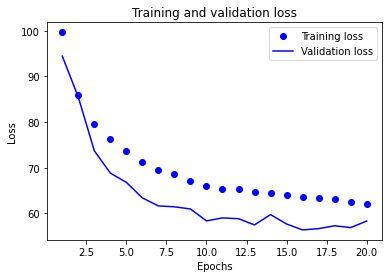

In [ ]:
loss = CBModel.history.history['loss']
val_loss = CBModel.history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss') 
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

As you can see, the model still has much more to learn! Keep training until you get convergence.

Now, let's apply it to the test set and get a confusion matrix.

In [ ]:
# Applying to the test set with a generator.
test_generator.reset()

# Get probabilities
output = CBModel.predict(test_generator)

In [ ]:
output

array([[2.2425091],
       [5.351239 ],
       [2.8094163],
       ...,
       [3.9364414],
       [4.7727532],
       [2.0010622]], dtype=float32)

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(test_generator.labels, output)
print('The mean absolute percentual error over the test is %.2f%%' % mape) #The mean absolute percentual error over the test is 64.37%

The mean absolute percentual error over the test is 64.37%


Now that we are happy, we can save the model.

In [ ]:
# Activating Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Saving the model
CBModel.save('/content/drive/MyDrive/VGG16_FM9528A.h5')

# Loading
# CBModel = keras.models.load_model('/content/drive/MyDrive/VGG16_FM9528A.h5')

## Visualizing learning

As a final example. We will visualize the learning, to detect exactly what is happening.

We will use [Grad CAM](https://arxiv.org/abs/1610.02391), a method that allows visualizing how one image activates the neural network. Basically we will look for the direction that the model used to get to its decisions. This requires to do some iterations that we won't explain in detail. Please refer to chapter 5.4 of Chollet's book to check the details.

In [ ]:
# Imports
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

In [ ]:
# Get the image in the right size
def get_img_array(img_path, size = (224, 224)):
    import tensorflow as tf
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 224, 224, 3)
    array = np.expand_dims(array, axis=0)
    array = preprocess_input(array)
    return array



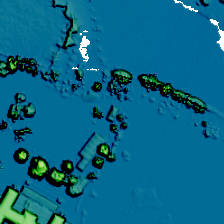

In [ ]:
# Get an image
img_path = '/content/LIDAR/LIDAR_19256.png'
data = get_img_array(img_path)

# Plot it
display(Image(img_path))

In [ ]:
# The explainer. Gotten from https://keras.io/examples/vision/grad_cam/
def make_gradcam_heatmap(
    img_array, model, last_conv_layer_name, classifier_layer_names
):
    from tensorflow import keras
    import tensorflow as tf
    # First, we create a model that maps the input image to the activations
    # of the last conv layer
    last_conv_layer = model.get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(model.inputs, last_conv_layer.output)

    # Second, we create a model that maps the activations of the last conv
    # layer to the final class predictions
    classifier_input = keras.Input(shape=last_conv_layer.output.shape[1:])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = keras.Model(classifier_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute class predictions
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

In [ ]:
# Print the predictions
preds = CBModel.predict(preprocess_input(data/255))
print(preds)

[[1.2352289]]


This example shows the model is 99% sure this is a street. Now we need to configure our model. We neeed to get the layers that are used for prediction (i.e. everything after the last convolution) and the last convolutional layer.

Get them with a model.summary()

In [ ]:
CBModel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0         
                                                                 
 block3_conv1 (Conv2D)       (None, 56, 56, 256)       2

In [ ]:
# Set the layers.
#last_conv_layer_name = "block5_conv3"
#classifier_layer_names =  ["block5_pool", 
#                           "flatten_1",
#                           "dense_3",
#                           "dense_4",
#                           "dense_5",]

# Set the layers.
last_conv_layer_name = "block5_conv3"
classifier_layer_names =  ["block5_pool", 
                           "flatten",
                           "dense",
                           "dense_1",
                           "dense_2"]


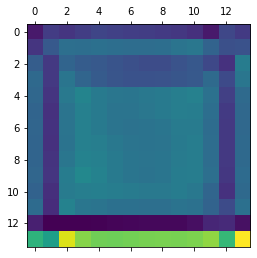

In [ ]:
# Plot the heatmap!
heatmap = make_gradcam_heatmap(
    preprocess_input(data/255), CBModel, last_conv_layer_name, classifier_layer_names
)

# Display heatmap
plt.matshow(heatmap)
plt.show()

Now, to really visualize what's going on, we will superimpose the heatmap over the input. The following code does just that.

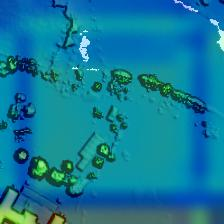

In [ ]:
# We load the original image
img = keras.preprocessing.image.load_img(img_path)
img = keras.preprocessing.image.img_to_array(img)

# We rescale heatmap to a range 0-255
heatmap = np.uint8(255 * heatmap)

# We use jet colormap to colorize heatmap
jet = cm.get_cmap("jet")

# We use RGB values of the colormap
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

# We create an image with RGB colorized heatmap
jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

# Superimpose the heatmap on original image
superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

# Save the superimposed image
save_path = "LIDAR_Example.jpg"
superimposed_img.save(save_path)

# Display Grad CAM
display(Image(save_path))


Now we can clearly see what is happening. 

This is the importance of the modelling procedures: We need to understand how much diversity we are including in our images: If we don't we might end up learning other things!

Try to change the filters and learning other characteristics.

In [ ]:
CBModel.layers[15].name

'block5_conv2'

In [ ]:
#2nd lab starts here: multimodal learning

## ResNet

In the following code we will use ResNet50 for the purposes of our model.

This model was trained over the ImageNet data, thus looking to classify among 1000 different types of objects, over a very large database of images. We can leverage these already-trained weights, and  adapt just the last few layers for our purposes.

We start by loading the model. Keras comes pre-packaged with a series of models, loaded into the [Applications library](https://keras.io/applications/). We start by first loading the model on-the-fly using the library. We can check the options of the model in the options of the function [ResNet50v2](https://keras.io/api/applications/resnet/#resnet50v2-function). Note that ResNet50 requires inputs between -1 and 1, so we do **not** need to rescale in the generator and we simply apply [ResNet50v2's preprocessing function](https://www.tensorflow.org/api_docs/python/tf/keras/applications/resnet_v2/preprocess_input).

We also need a package that allows for an efficient storage of the model using a binary format. The package is called [h5py](https://www.h5py.org/) and also allows for storing your pre-trained models. You can read a tutorial for this [here](https://machinelearningmastery.com/save-load-keras-deep-learning-models/).

In [ ]:
import numpy as np
import h5py as h5py
import PIL # image processing systerm 

# Others
import numpy as np
from sklearn.model_selection import train_test_split

# For AUC estimation and ROC plots
from sklearn.metrics import roc_curve, auc

# Plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Image and directories
import cv2
import os

# Tensorflow
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow import keras

In [ ]:
HouseData = df1[["income", "path"]]
from sklearn.model_selection import train_test_split
train, test = train_test_split(HouseData, 
                               test_size = 0.3,
                               random_state = 251093007)

In [ ]:
# Parameters
ImageSize = (224,224)
BatchSize = 128 

In [ ]:
# Import base model. Using ResNet50v2.
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input

# Import model with input layer
base_model = ResNet50V2(weights = 'imagenet',    
                      include_top = False,       
   
                      input_shape= (224, 224, 3) 
                      )

# Set the base model to untrainable.
base_model.trainable = False  


In [ ]:

# Input layer
inputs = keras.Input(shape=ImageSize + (3,), #(224,224,3)
                        name = 'image_only_input') #just to give a name 


###
x = base_model(inputs, training=False) 


# Flatten to make it the same size as the original model
x = Flatten()(x)
# x has input, resnet and flattern on top 

# Now we actually add it to a layer. Note the way of writing it.
x = Dense(64, activation='relu')(x)
x = Dropout(0.6)(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.6)(x)



# Add final output layer.
outputs = Dense(1, activation='relu')(x)

# price is continous and positive 

# Create the complete model object
ImageOnlyModel = keras.Model(inputs, outputs)
#[output1, output2] for multiple model
ImageOnlyModel.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_only_input (InputLaye  [(None, 224, 224, 3)]    0         
 r)                                                              
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dense_6 (Dense)             (None, 64)                6422592   
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                           

In [ ]:
# Compiling the model! Note the learning rate.
opt = optimizers.Adam(learning_rate=1e-5,            # Learning rate needs to be tweaked for convergence and be small!
                      decay=1e-3 / 200    # Decay of the LR 10^-3 / 1 / 50 / 100 / 200 # how the weight can move upward and downward, drfit from 0
                      ) 

# Adam adjusts the learning rate 
# call back: applies as the model trains, learning rate scheduler 
ImageOnlyModel.compile(loss=keras.losses.MeanAbsolutePercentageError(), # This is NOT a classification problem! mse woould lead
                       # to gigatic result 
                      optimizer=opt
                       )

In [ ]:
# Define parameters

target_size = (224, 224)
batch_size = 128
DataDir = 'LIDAR/'

# Define generators
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
                                  rescale=None,                         # Inputs are scaled in the preprocessing function
                                  shear_range=0,                          # Shear? # stage picture of house 
                                  zoom_range=0.1,                           # Zoom? 0.2 means from 80% to 120%
                                  horizontal_flip=False ,                     # Flip horizontally?
                                  vertical_flip= False,                      # Flip vertically?
                                  preprocessing_function=preprocess_input,  # ResNet expects specific input. Set it up with this function that comes prepackaged.
                                  validation_split = 0.2                    # Create a validation cut?
                                  )

test_datagen = ImageDataGenerator(
                                  rescale=None,                        # Inputs are scaled in the preprocessing function
                                  shear_range=0,                          # Shear?
                                  zoom_range=0,                           # Zoom? 0.2 means from 80% to 120%
                                  horizontal_flip=False,                     # Flip horizontally?
                                  vertical_flip=False,                      # Flip vertically?
                                  preprocessing_function=preprocess_input,  # VGG expects specific input. Set it up with this function that comes prepackaged.
                                  )

# Point to the data and **give the targets**. Note the "raw" class_mode
train_generator = train_datagen.flow_from_dataframe(train, # the name of the dataframe I'm flowing from 
                                                    directory='.',  # Look from root directory
                                                    x_col='path',   # Path to images column that has image 
                                                    y_col='income',  # Target
                                                    target_size=target_size, # Same as last lab
                                                    batch_size=batch_size,
                                                    shuffle=True, # always a good idea to create diversity 
                                                    class_mode='raw', # when we do regression, raw means don't do anything 
                                                    subset='training', 
                                                    interpolation="bilinear"
                                                   )

validation_generator = train_datagen.flow_from_dataframe(train,
                                                    directory='.',
                                                    x_col='path',
                                                    y_col='income',
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    class_mode='raw',
                                                    subset='validation', # identical with train except for "validaiton "
                                                    interpolation="bilinear"
                                                   )

test_generator = test_datagen.flow_from_dataframe(test, # use the test set to flow from
                                                  directory='.',
                                                  x_col='path',
                                                  y_col='income',
                                                  target_size=target_size,
                                                  batch_size=batch_size,
                                                  shuffle=False,  # don't shuffle the data 
                                                  class_mode='raw',
                                                  interpolation="bilinear"
                                                  )

Found 20565 validated image filenames.
Found 5141 validated image filenames.
Found 11017 validated image filenames.


In [ ]:
#priming 

# Number of epochs
epochs = 2

# Train!
ImageOnlyModel.fit(
                  train_generator,
                  epochs=epochs,
                  validation_data=validation_generator,
                   steps_per_epoch = 160,
                   validation_steps = 40)

In [ ]:
base_model.trainable = True

# Recompile as we changed things.
ImageOnlyModel.compile(loss=keras.losses.MeanAbsolutePercentageError(), # This is NOT a classification problem!
                      optimizer=opt
                       )

ImageOnlyModel.summary()

# batchnormaliztion has two parameters that are untrainable in resnet. they are frozen 
## in VGG this doesn't exsit 

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_only_input (InputLaye  [(None, 224, 224, 3)]    0         
 r)                                                              
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dense_6 (Dense)             (None, 64)                6422592   
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                           

In [ ]:
# Define callbacks
checkpoint_path='checkpoints/ImageOnlyModel.{epoch:02d}-{val_loss:.2f}.h5'
checkpoint_dir=os.path.dirname(checkpoint_path)

my_callbacks = [
    # Stop training if validation error stays within 0.00001 for three rounds.
    tf.keras.callbacks.EarlyStopping(monitor='val_loss',  # if overfitting then stop
                                     min_delta=0.00001,
                                     patience=5), # how many rounds to wait. val loss can go down up and down 
    # Save the weights of the best performing model to the checkpoint folder. # save the best iteration of the model
    tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                       save_best_only=True,
                                       save_weights_only=True), # save only the weiths, might not be compatible if save the whole thing 
]

# create a new folder,name it checkpoints
# don't save this in colab, save in google drive. Don't lose anything if terminated 

# Number of epochs
epochs = 15

# Train!
ImageOnlyModel.fit(
                  train_generator, # Pass the train generator
                  epochs=epochs, # Pass the epochs
                  validation_data=validation_generator, # Pass the validation generator
                  callbacks=my_callbacks, # Add the callbacks
                  steps_per_epoch =  160, #int( np.ceil(train.shape[0] / batch_size) ), # Usually cases / batch_size = 176. Reduced to 32 so it runs faster. 11230/128 full path = 64
                  validation_steps = 40 #int( 0.2*(np.ceil(train.shape[0] / batch_size) )) #Number of validation steps. Again cases / batch_size = 44.
          )


Epoch 1/15
160/160 [==============================] - 520s 3s/step - loss: 69.4595 - val_loss: 58.2659
Epoch 2/15
160/160 [==============================] - 497s 3s/step - loss: 64.4350 - val_loss: 53.2638
Epoch 3/15
160/160 [==============================] - 486s 3s/step - loss: 62.7505 - val_loss: 52.0597
Epoch 4/15
160/160 [==============================] - 534s 3s/step - loss: 60.3989 - val_loss: 53.1251
Epoch 5/15
160/160 [==============================] - 479s 3s/step - loss: 59.9635 - val_loss: 51.8581
Epoch 6/15
160/160 [==============================] - 478s 3s/step - loss: 59.3121 - val_loss: 53.7980
Epoch 7/15
160/160 [==============================] - 476s 3s/step - loss: 58.2849 - val_loss: 53.1729
Epoch 8/15
160/160 [==============================] - 477s 3s/step - loss: 58.4957 - val_loss: 50.4103
Epoch 9/15
160/160 [==============================] - 473s 3s/step - loss: 57.1192 - val_loss: 50.7499
Epoch 10/15
160/160 [==============================] - 471s 3s/step - los

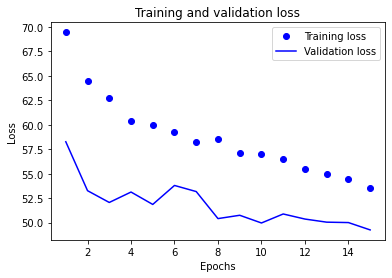

In [ ]:
# Plotting training history.
loss = ImageOnlyModel.history.history['loss']
val_loss = ImageOnlyModel.history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Load the weights. THIS REQUIRES FIRST CREATING THE LOGIC.

ImageOnlyModel.load_weights('/content/checkpoints/ImageOnlyModel.15-49.25.h5')

# run keras first, then build the model as above 

In [ ]:
# Applying to the test set with a generator.
test_generator.reset()

# Get probabilities
output = ImageOnlyModel.predict(test_generator)

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
mape = mean_absolute_percentage_error(test_generator.labels, output)
print('The mean absolute percentage error over the test is %.2f%%' % mape)

The mean absolute percentage error over the test is 61.80%


## Multimodal model

Now we can train a multi-input model. The idea of this model is to create two inputs, one with the images and the second one with the structured data. We need to first transform the zipcodes into a binary input and normalize the data though. The following code does the preprocessing of the data.

In [ ]:
df1

,id,LSOA11CD,LSOA11NM,SOAC11CD,SOAC11NM,MSOA11CD,MSOA11NM,LAD17CD,LAD17NM,LACCD,LACNM,income,employment,education,health,crime,barriers,living_environment,path
0,48552,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,2.5,0.042,7.632,-1.345,-0.139,30.886,13.902,LIDAR/LIDAR_48552.png
1,46571,E01000759,Bromley 034A,8a,Affluent communities,E02000160,Bromley 034,E09000006,Bromley,1a1r,Rural-Urban Fringe,2.5,0.042,7.632,-1.345,-0.139,30.886,13.902,LIDAR/LIDAR_46571.png
2,21161,E01000487,Brent 006E,7b,Young ethnic communities,E02000098,Brent 006,E09000005,Brent,4a1r,Ethnically Diverse Metropolitan Living,12.3,0.068,7.192,-0.782,0.109,40.432,21.233,LIDAR/LIDAR_21161.png
3,26188,E01004572,Wandsworth 016A,6a,Inner city cosmopolitan,E02000938,Wandsworth 016,E09000032,Wandsworth,5a1r,London Cosmopolitan,14.2,0.090,8.750,-0.328,1.062,35.035,21.583,LIDAR/LIDAR_26188.png
4,46276,E01033320,Lewisham 017E,6a,Inner city cosmopolitan,E02000669,Lewisham 017,E09000023,Lewisham,4a1r,Ethnically Diverse Metropolitan Living,12.5,0.105,7.185,-0.143,0.133,32.410,38.222,LIDAR/LIDAR_46276.png
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36718,35116,E01003162,Lambeth 022E,6a,Inner city cosmopolitan,E02000639,Lambeth 022,E09000022,Lambeth,5a1r,London Cosmopolitan,19.3,0.108,25.952,0.259,0.093,29.343,32.090,LIDAR/LIDAR_35116.png
36719,19453,E01001226,Ealing 019C,6a,Inner city cosmopolitan,E02000256,Ealing 019,E09000009,Ealing,4a1r,Ethnically Diverse Metropolitan Living,7.8,0.058,1.939,-0.225,-0.610,36.113,23.364,LIDAR/LIDAR_19453.png
36720,27624,E01000491,Brent 030B,6a,Inner city cosmopolitan,E02000122,Brent 030,E09000005,Brent,4a1r,Ethnically Diverse Metropolitan Living,13.3,0.089,9.526,-0.438,0.441,39.773,22.605,LIDAR/LIDAR_27624.png
36721,6327,E01002446,Hillingdon 031B,7a,Urban cultural mix,E02000524,Hillingdon 031,E09000017,Hillingdon,4a1r,Ethnically Diverse Metropolitan Living,8.6,0.064,21.986,-0.194,1.286,32.287,28.307,LIDAR/LIDAR_6327.png


In [ ]:
df2 = df1

In [ ]:
df3 = df2.drop(['id', 'LSOA11CD', 'LSOA11NM', 'SOAC11CD', 'SOAC11NM', 'MSOA11CD',
       'MSOA11NM', 'LAD17CD',  'LACCD','LACNM'], axis = 1)

In [ ]:
# Create a train / test split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df3, 
                               test_size = 0.3,
                               random_state = 251093007)

In [ ]:
# Import preprocessors
# traditional method, samll inputs, combine into one model
# higher size of dense layer. Learn more parameters 
from sklearn.preprocessing import MinMaxScaler

# What are the continous variables?
continousCols = [
       'employment', 'education', 'health', 'crime', 'barriers',
       'living_environment']

# Define scaler and train it over the train set.
Scaler = MinMaxScaler()
Scaler.fit(train[continousCols])

MinMaxScaler()

In [ ]:
# Apply over sets. Ignore warning.
train[continousCols] = Scaler.transform(train[continousCols])
test[continousCols] = Scaler.transform(test[continousCols])

In [ ]:
# Import and train binarizer.
from sklearn.preprocessing import LabelBinarizer
zipBinarizer = LabelBinarizer().fit(df3["LAD17NM"])

In [ ]:
# Store binary variables in matrix
cat_train = zipBinarizer.transform(train["LAD17NM"])
cat_test = zipBinarizer.transform(test["LAD17NM"])

In [ ]:
# Assign to new columns in dataframe. Ignore warning. 
for i in range(0, 33):
    col_name = "zipcode_" + str(i)
    train[col_name] = pd.Series(cat_train[:,i], index=train.index)
    test[col_name] = pd.Series(cat_test[:,i], index=test.index)

In [ ]:
image_input = tf.keras.Input(shape=ImageSize + (3,),
                             name = 'image_input')

# Load an empty ResNet
resnet_input = ResNet50V2(weights = 'imagenet',     # The weights from the ImageNet competition
                      include_top = False,       # Do not include the top layer, which classifies.
                      input_shape= (224, 224, 3) # Input shape. Three channels.
                      )
resnet_input.trainable = False

# Use the model API to attach it to our input layer.
ImageClassifier = resnet_input(image_input, training=False)

# Add a Flatten layer with the model API.
ImageClassifier = Flatten()(ImageClassifier)

#input layer to the flattern layer for the image

# Now we create the structured data layer.
predictive_features = 6 + 32 # Three regular, 6 countinous + 32 categorical
features_input  = keras.Input(shape=(predictive_features,),
                              name="structured_data") 
Structured =  Dense( 12, activation = 'relu' )(features_input) # Add one processing layer
Structured =  Dropout(0.5)(Structured)   # Dropout after  Dense
Structured =  Dense(6, activation = 'relu' )(Structured)
Structured =  Dropout(0.5)(Structured)   # Dropout after  Dense

# Merge all available features into a single large vector via concatenation
merged = concatenate([ImageClassifier, Structured]) # output from the final dropout of data and image 
# in resnet you add them up, but here different types of variables 

# Add a few prediction layers
merged = Dense(256, activation='relu')(merged)
merged = Dropout(0.5)(merged)

income_multi = Dense(1, activation='relu', name="income_multi")(merged)

# Instantiate an end-to-end model predicting house_prices
multimodal_model = keras.Model(inputs=[image_input, features_input], 
                               outputs=[income_multi])

In [ ]:
# Compile with same optimizer as before.
multimodal_model.compile(optimizer = opt,
                    loss='mean_absolute_percentage_error')  #mean_absolute_percentage_error

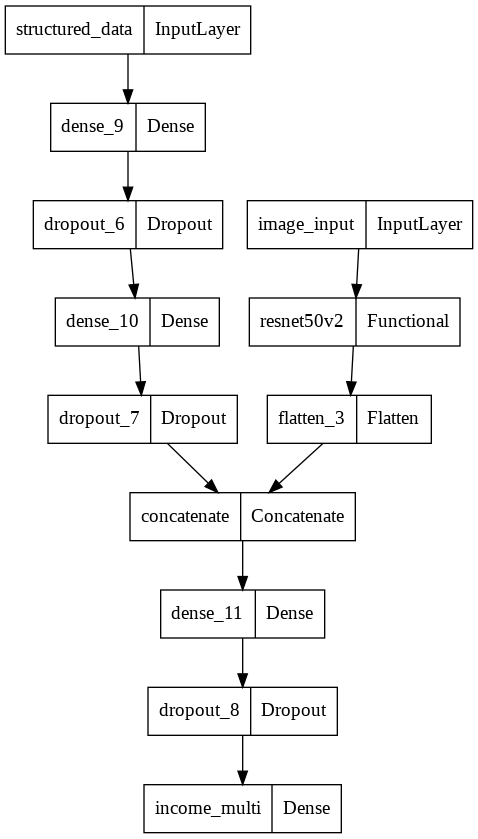

In [ ]:
import pydot as pyd
from tensorflow.keras.utils import plot_model

#Visualize Model
plot_model(
          multimodal_model, to_file='model.png', show_shapes=False, show_layer_names=True,
          rankdir='TB', expand_nested=False, dpi=96
          )

In [ ]:
pred_cols = np.r_[1:8, 9:(train.columns.shape[0]-1)] # leave one binary variable out 

train.columns[pred_cols]

Index(['income', 'employment', 'education', 'health', 'crime', 'barriers',
       'living_environment', 'zipcode_0', 'zipcode_1', 'zipcode_2',
       'zipcode_3', 'zipcode_4', 'zipcode_5', 'zipcode_6', 'zipcode_7',
       'zipcode_8', 'zipcode_9', 'zipcode_10', 'zipcode_11', 'zipcode_12',
       'zipcode_13', 'zipcode_14', 'zipcode_15', 'zipcode_16', 'zipcode_17',
       'zipcode_18', 'zipcode_19', 'zipcode_20', 'zipcode_21', 'zipcode_22',
       'zipcode_23', 'zipcode_24', 'zipcode_25', 'zipcode_26', 'zipcode_27',
       'zipcode_28', 'zipcode_29', 'zipcode_30', 'zipcode_31'],
      dtype='object')

In [ ]:
# Define parameters

target_size = (224, 224)
batch_size = 64
DataDir = 'LIDAR/'

# What are the useful columns? Note the position of the target. 
pred_cols = pred_cols

# We only modify the generators. Note the y vector.
train_generator = train_datagen.flow_from_dataframe(train,
                                                    directory='.',
                                                    x_col='path',
                                                    y_col=train.columns[pred_cols],
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    class_mode='raw',
                                                    subset='training',
                                                    interpolation="bilinear"
                                                   )

validation_generator = train_datagen.flow_from_dataframe(train,
                                                    directory='.',
                                                    x_col='path',
                                                    y_col=train.columns[pred_cols],
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    class_mode='raw',
                                                    subset='validation',
                                                    interpolation="bilinear"
                                                   )

test_generator = train_datagen.flow_from_dataframe(test,
                                                    directory='.',
                                                    x_col='path',
                                                    y_col=test.columns[pred_cols],
                                                    target_size=target_size,
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    class_mode='raw',
                                                    subset='training',
                                                    interpolation="bilinear"
                                                   )

# Define combined generator
# generator is a fucntion, it's alywas running, whenever gets cold, then sent images
def train_generator_func():
    count = 0

    while True: # always run 
        if  count == len(train.index): # if I get to the botom of dataframe, reset it 
            train_generator.reset()
            break
        count += 1 # if not increase by one, feed another one 
        data = train_generator.next()

        # Let's identify where is what.
        target_location = 0
        predictive_columns = np.r_[1:39]

        # Now we reshape everything. First the images.
        imgs = data[0]
        # Now we need to extract which ones are the predictive variables.
        cols = data[1][:, predictive_columns] # 1 is target, extract what's is predicted 
        # Finally we need the targets.
        targets = data[1][:, target_location] # 2nd part the data
        yield [imgs, cols], targets #output 


def validation_generator_func():
    count = 0
    while True:
        if count == len(train.index):
            validation_generator.reset()
            break
        count += 1
        data = validation_generator.next()

        # Let's identify where is what.
        target_location = 0
        predictive_columns = np.r_[1:39]

        # Now we reshape everything. First the images.
        imgs = data[0]
        # Now we need to extract which ones are the predictive variables.
        cols = data[1][:, predictive_columns]
        # Finally we need the targets.
        targets = data[1][:, target_location]
        yield [imgs, cols], targets
        
        
def test_generator_func():
    count = 0
    test_generator.reset()
    while True:
        if count == len(test.index):
            test_generator.reset()
            break
        count += 1
        data = test_generator.next()

        # Let's identify where is what.
        target_location = 0
        predictive_columns = np.r_[1:39]

        # Now we reshape everything. First the images.
        imgs = data[0]
        # Now we need to extract which ones are the predictive variables.
        cols = data[1][:, predictive_columns]
        # Finally we need the targets.
        targets = data[1][:, target_location]
        yield [imgs, cols], targets

Found 20565 validated image filenames.
Found 5141 validated image filenames.
Found 8814 validated image filenames.


In [ ]:
# This is how the data comes out now.
train_test_output = train_generator_func()
next(train_test_output)[0]

[array([[[[-0.69954395,  0.07571816,  0.16078436],
          [-0.67677325,  0.09340048,  0.16708124],
          [-0.6586702 ,  0.09803927,  0.18054557],
          ...,
          [-0.80451596, -0.02036601,  0.11982787],
          [-1.        , -0.4044187 , -0.08246887],
          [-1.        , -0.9404096 , -0.44068336]],
 
         [[-0.69954395,  0.07571816,  0.16078436],
          [-0.67677325,  0.09340048,  0.16708124],
          [-0.6586702 ,  0.09803927,  0.18054557],
          ...,
          [-0.80451596, -0.02036601,  0.11982787],
          [-1.        , -0.4044187 , -0.08246887],
          [-1.        , -0.9404096 , -0.44068336]],
 
         [[-0.69954395,  0.07571816,  0.16078436],
          [-0.67677325,  0.09340048,  0.16708124],
          [-0.6586702 ,  0.09803927,  0.18054557],
          ...,
          [-0.80451596, -0.02036601,  0.11982787],
          [-1.        , -0.4044187 , -0.08246887],
          [-1.        , -0.9404096 , -0.44068336]],
 
         ...,
 
         [[-

In [ ]:
# Warmup
# Steps and epochs
epochs=2
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = np.amax([validation_generator.samples // validation_generator.batch_size, 1])

In [ ]:
# Train!
multimodal_model.fit(train_test_output, # the custom 
                      epochs=epochs,
                      steps_per_epoch= 160, #steps_per_epoch,
                      validation_data=validation_generator_func(),
                      validation_steps=44 #validation_steps
                     )

Epoch 1/2
160/160 [==============================] - 252s 1s/step - loss: 57.3104 - val_loss: 54.4788
Epoch 2/2
160/160 [==============================] - 222s 1s/step - loss: 54.3411 - val_loss: 52.5539


Now we can create the model!

We will:

1. Create two models, one for each data type.
2. Concatenate these inputs.
3. Add a few dense layers.
4. Compile the output.
5. Create a generator that can deal with this mixed data.

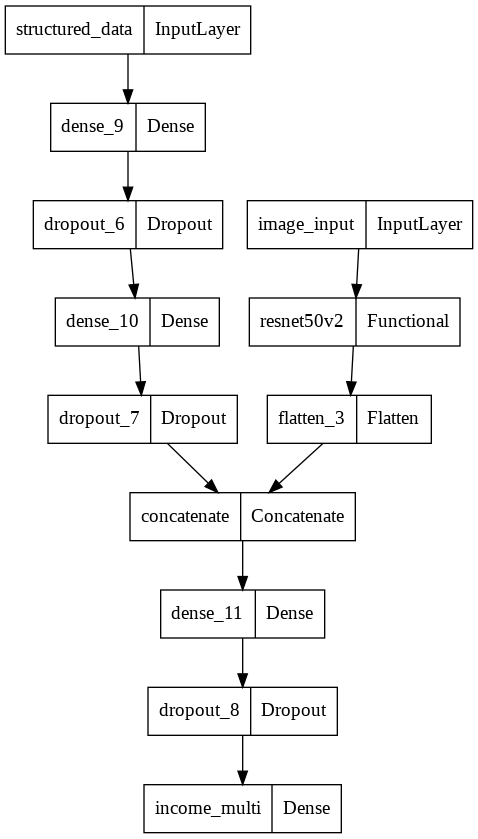

In [ ]:
import pydot as pyd
from tensorflow.keras.utils import plot_model

#Visualize Model
plot_model(
          multimodal_model, to_file='model.png', show_shapes=False, show_layer_names=True,
          rankdir='TB', expand_nested=False, dpi=96
          )

Now the last part is to modify the generator. The structure is almost the same, except we need to code a custom function that will be able to process the multiple inputs and outputs. The following code accomplishes this.

In [ ]:
# Set it as trainable
resnet_input.trainable = True

# Recompile
multimodal_model.compile(optimizer = opt,
                    loss='mean_absolute_percentage_error')  #mean_absolute_percentage_error

# Define callbacks
checkpoint_path='checkpoints/MultimodalModel{epoch:02d}-{val_loss:.2f}.h5'
checkpoint_dir=os.path.dirname(checkpoint_path)

my_callbacks = [
    # Stop training if validation error stays within 0.00001 for three rounds.
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                     min_delta=0.00001,
                                     patience=5),
    # Save the weights of the best performing model to the checkpoint folder.
    tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                       save_best_only=True,
                                       save_weights_only=True,
                                       monitor='val_loss'
                                       ),
]

# Steps and epochs
epochs=20
steps_per_epoch = train_generator.samples // train_generator.batch_size
validation_steps = np.amax([validation_generator.samples // validation_generator.batch_size, 1])

# Train!
multimodal_model.fit(train_generator_func(),
                      epochs=epochs,
                      steps_per_epoch= 160, #steps_per_epoch,
                      validation_data=validation_generator_func(),
                      validation_steps=40, #validation_steps,
                     callbacks=my_callbacks
                     )

Epoch 1/20
160/160 [==============================] - 293s 2s/step - loss: 53.3644 - val_loss: 52.7123
Epoch 2/20
160/160 [==============================] - 283s 2s/step - loss: 52.3219 - val_loss: 52.3700
Epoch 3/20
160/160 [==============================] - 284s 2s/step - loss: 50.4067 - val_loss: 49.7990
Epoch 4/20
160/160 [==============================] - 282s 2s/step - loss: 49.4149 - val_loss: 51.0003
Epoch 5/20
160/160 [==============================] - 282s 2s/step - loss: 48.2659 - val_loss: 50.4828
Epoch 6/20
160/160 [==============================] - 284s 2s/step - loss: 48.3653 - val_loss: 49.8907
Epoch 7/20
160/160 [==============================] - 282s 2s/step - loss: 46.3398 - val_loss: 49.5371
Epoch 8/20
160/160 [==============================] - 282s 2s/step - loss: 46.5533 - val_loss: 48.8086
Epoch 9/20
160/160 [==============================] - 282s 2s/step - loss: 45.4650 - val_loss: 49.5448
Epoch 10/20
160/160 [==============================] - 282s 2s/step - los

We should again restore the best model.

In [ ]:
multimodal_model.load_weights('/content/checkpoints/MultimodalModel20-47.93.h5')

The model is better! This is the power of a multimodal learning strategy. It allows combining background knowledge (structured data) with unstructured data to reach combined outputs. Let's check the training plot and the testing error.

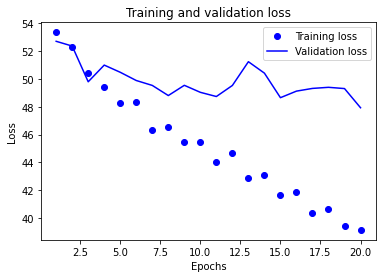

In [ ]:
loss = multimodal_model.history.history['loss']
val_loss = multimodal_model.history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Calculate outputs in test set
STEP_SIZE_TEST = test_generator.n//test_generator.batch_size

house_test = multimodal_model.predict(test_generator_func(),
                                    steps=STEP_SIZE_TEST+1,
                                    verbose=1)

138/138 [==============================] - 164s 1s/step


In [ ]:
mape = mean_absolute_percentage_error(test_generator.labels[:,3], house_test)
print('The mean absolute percentual error over the test is %.2f%%' % mape)

The mean absolute percentual error over the test is 58.68%


We have a lower error now! This is almost half of the error of a model just with the structured data (try it!). Our multimodal model is capable of learning context from our multiple inputs!

Now you know how to include multiple data sources to your models. Go create your own now!

## Extra: Grad-RAM

GradCAM for regression requires some modifications to the code. The following code makes those changes for a model such as ResNet50. **You need to modify this if you are using VGG or another model!**.

In [ ]:
# The explainer. Gotten from https://keras.io/examples/vision/grad_cam/
def make_gradcam_heatmap(
    img_array, model, last_conv_layer_name, classifier_layer_names
):
    from tensorflow import keras
    import tensorflow as tf
    # First, we create a model that maps the input image to the activations
    # of the last conv layer. This layer is located at model.layers[1] as the
    # ResNet model is the first "layer" of the ImageOnlyModel. Modify as needed.
    last_conv_layer = model.layers[1].get_layer(last_conv_layer_name)
    last_conv_layer_model = keras.Model(model.layers[1].inputs, last_conv_layer.output)

    # Second, we create a model that maps the activations of the last conv
    # layer to the final class predictions
    regression_input = keras.Input(shape=last_conv_layer.output.shape[1:])
    x = regression_input
    for layer_name in classifier_layer_names:
        try:
            x = model.get_layer(layer_name)(x)
        except:
            x = model.layers[1].get_layer(layer_name)(x)
    regression_model = keras.Model(regression_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute predictions
        top_class_channel = regression_model(last_conv_layer_output)

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the regression
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of activation
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    return heatmap

Now we can proceed as normal. Let's get the last convolutional layer and the top of the model.

In [ ]:
base_model.summary()

Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_4[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                         

In [ ]:
ImageOnlyModel.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_only_input (InputLaye  [(None, 224, 224, 3)]    0         
 r)                                                              
                                                                 
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dense_6 (Dense)             (None, 64)                6422592   
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                           

In [ ]:
last_conv_layer_name = "block5_conv3"
classifier_layer_names =  ["block5_pool", 
                           "flatten_1",
                           "dense_3",
                           "dense_4",
                           "dense_5"]

In [ ]:
# Set the layers.
last_conv_layer_name = "conv5_block3_out"
classifier_layer_names =  ["flatten_2",
                           "dense_6",
                           "dropout_4",
                           "dense_7",
                           "dropout_5",
                           "dense_8",]

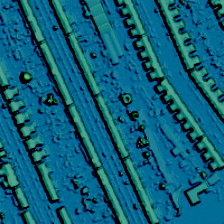

In [ ]:
# Display
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

# Get the image in the right size
def get_img_array(img_path, size = (224, 224)):
    import tensorflow as tf
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 224, 224, 3)
    array = np.expand_dims(array, axis=0)
    array = preprocess_input(array)
    return array

# Get an image
img_path = 'LIDAR/LIDAR_27946.png'
data = get_img_array(img_path)

# Plot it
display(Image(img_path))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


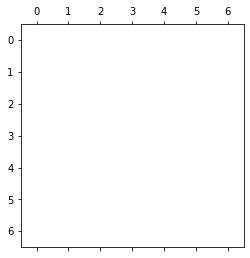

In [ ]:
# Plot the heatmap!
heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names
)

# Display heatmap
plt.matshow(heatmap)
plt.show()

Take a summary of output, slice the output into quantile, random select a few numbers in that quantile, locate the path,then plot 

In [ ]:
dfh = HouseData.iloc[0:5000]

In [ ]:
dfh = test.copy()
dfh['pred'] = output

In [ ]:
dfsort = dfh.loc[abs(dfh['income'] - dfh['pred']) <1].sort_values('income')
dfsort

,income,path,pred
4811,0.6,LIDAR/LIDAR_30868.png,0.888270
940,0.6,LIDAR/LIDAR_30621.png,1.063396
16693,0.6,LIDAR/LIDAR_33845.png,1.280098
14915,0.6,LIDAR/LIDAR_30371.png,1.065108
30926,0.6,LIDAR/LIDAR_30866.png,1.209829
...,...,...,...
31909,17.7,LIDAR/LIDAR_22864.png,17.991070
24503,18.8,LIDAR/LIDAR_37008.png,18.250328
10748,18.8,LIDAR/LIDAR_55154.png,17.877861
24117,19.0,LIDAR/LIDAR_56169.png,19.771942


In [ ]:
dfsortdep1 = dfsort.loc[dfsort['income'] <= 2]
dfsortdep1

,income,path,pred
4811,0.6,LIDAR/LIDAR_30868.png,0.888270
940,0.6,LIDAR/LIDAR_30621.png,1.063396
16693,0.6,LIDAR/LIDAR_33845.png,1.280098
14915,0.6,LIDAR/LIDAR_30371.png,1.065108
30926,0.6,LIDAR/LIDAR_30866.png,1.209829
...,...,...,...
31595,2.0,LIDAR/LIDAR_23727.png,2.970521
26123,2.0,LIDAR/LIDAR_12961.png,2.871701
11034,2.0,LIDAR/LIDAR_17193.png,2.195671
8907,2.0,LIDAR/LIDAR_24224.png,2.471982


In [ ]:
dfsortdep2 = dfsort.loc[ (dfsort['income'] <= 7) & (dfsort['income'] >= 6.8)]
dfsortdep2

,income,path,pred
31717,6.8,LIDAR/LIDAR_39463.png,6.932823
14223,6.8,LIDAR/LIDAR_4522.png,6.054817
28833,6.8,LIDAR/LIDAR_3778.png,7.320946
2766,6.8,LIDAR/LIDAR_19890.png,6.704042
24622,6.8,LIDAR/LIDAR_19891.png,6.973449
27219,6.8,LIDAR/LIDAR_4020.png,7.191947
11082,6.8,LIDAR/LIDAR_20141.png,5.967257
33569,6.8,LIDAR/LIDAR_47047.png,6.781512
13082,6.8,LIDAR/LIDAR_28709.png,7.099459
6797,6.8,LIDAR/LIDAR_38725.png,5.984307


In [ ]:
dfsortdep3 = dfsort.loc[ (dfsort['income'] <= 12) & (dfsort['income'] >= 11.5)]
dfsortdep3

,income,path,pred
3140,11.5,LIDAR/LIDAR_25619.png,11.516292
35813,11.5,LIDAR/LIDAR_42080.png,12.306589
21089,11.6,LIDAR/LIDAR_37977.png,10.738504
1565,11.6,LIDAR/LIDAR_47731.png,12.038338
10349,11.6,LIDAR/LIDAR_65288.png,11.925039
10698,11.6,LIDAR/LIDAR_12035.png,12.090896
12216,11.6,LIDAR/LIDAR_38559.png,11.339517
32358,11.6,LIDAR/LIDAR_48478.png,11.823128
30262,11.6,LIDAR/LIDAR_47732.png,11.594704
35470,11.6,LIDAR/LIDAR_42327.png,11.224421


In [ ]:
dfsort = dfh.loc[abs(dfh['income'] - dfh['pred']) <3].sort_values('income')
dfsort
dfsortdep4 = dfsort.loc[ dfsort['income'] >= 14]
dfsortdep4

,income,path,pred
23098,14.0,LIDAR/LIDAR_55935.png,11.469774
35006,14.0,LIDAR/LIDAR_43227.png,12.676840
13641,14.0,LIDAR/LIDAR_40773.png,12.937778
21749,14.0,LIDAR/LIDAR_15229.png,12.633265
11989,14.0,LIDAR/LIDAR_55688.png,11.545852
...,...,...,...
17779,19.4,LIDAR/LIDAR_44499.png,20.807219
21422,19.6,LIDAR/LIDAR_58136.png,18.796019
20261,20.4,LIDAR/LIDAR_55921.png,18.152864
6642,20.6,LIDAR/LIDAR_41447.png,18.517395


In [ ]:
dfh = dfh.loc[abs(dfh['income'] - dfh['pred']) < 0.1]


Low deprivation

picture 15207


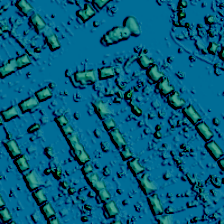

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


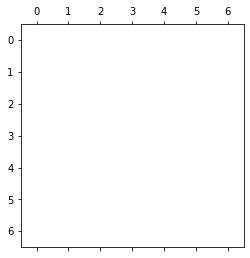

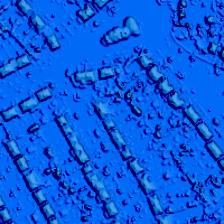

picture 15208


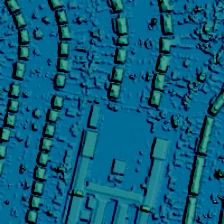

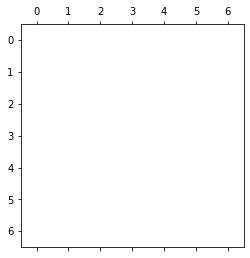

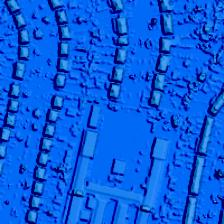

picture 15209


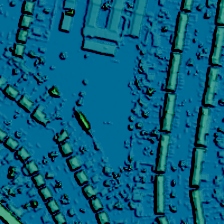

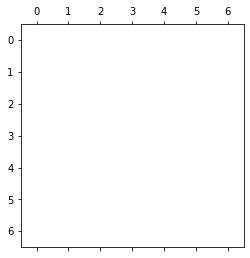

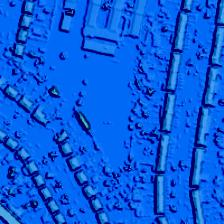

picture 15210


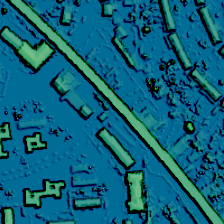

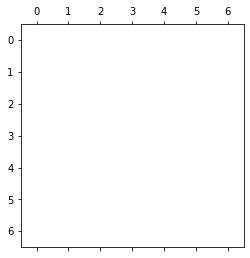

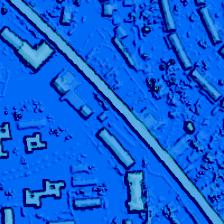

picture 15211


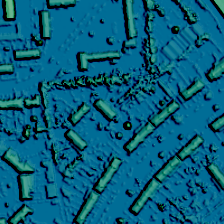

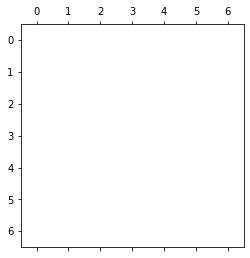

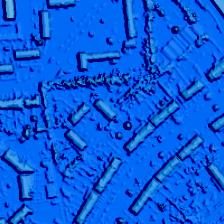

picture 15212


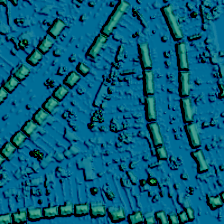

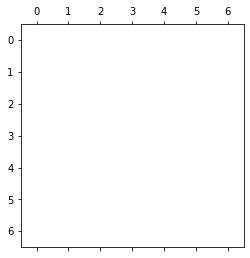

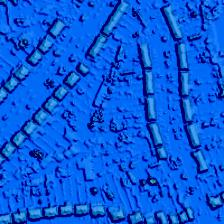

picture 15213


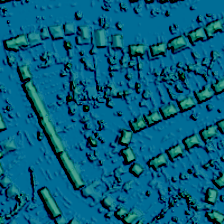

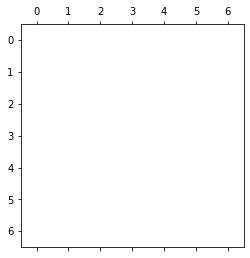

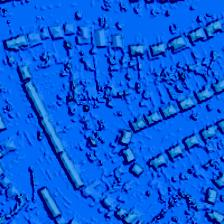

picture 15214


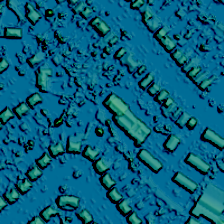

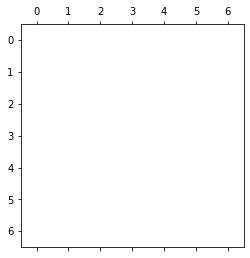

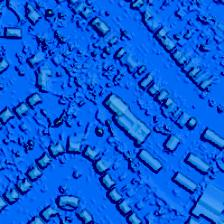

picture 15215


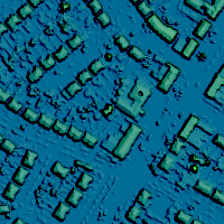

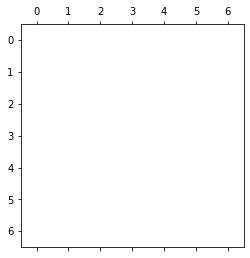

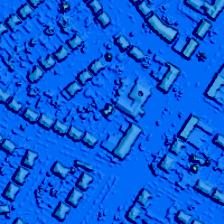

picture 15216


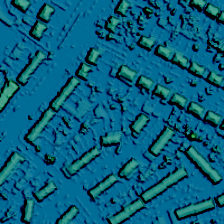

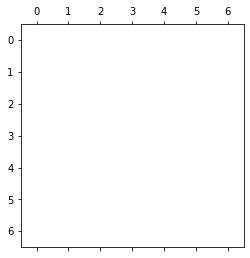

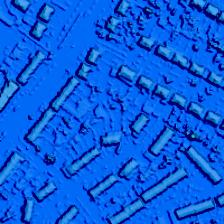

picture 15217


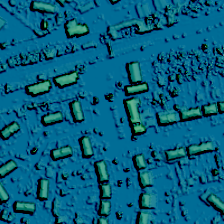

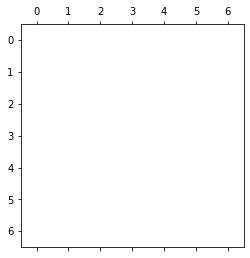

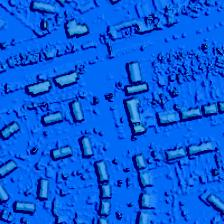

picture 15218


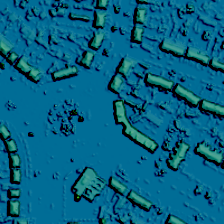

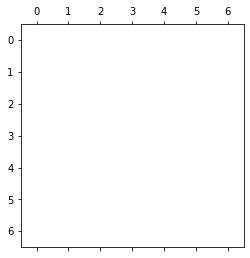

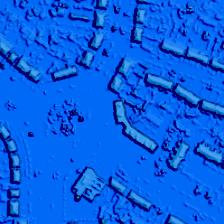

picture 15219


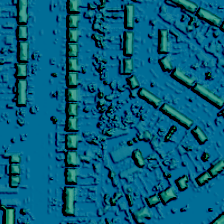

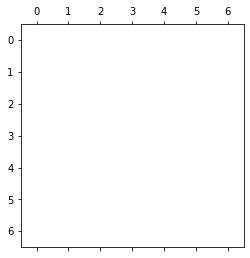

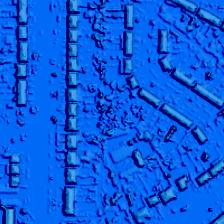

picture 15220


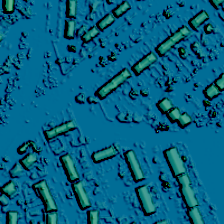

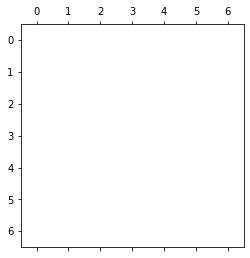

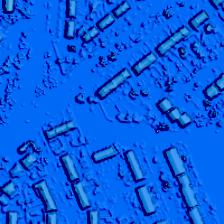

picture 15221


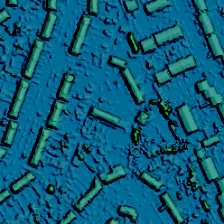

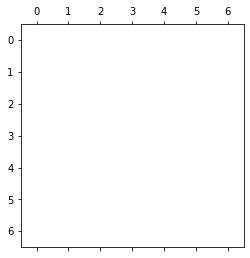

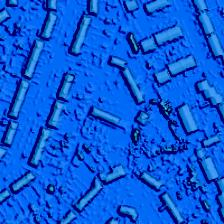

picture 15222


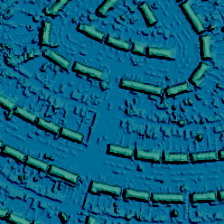

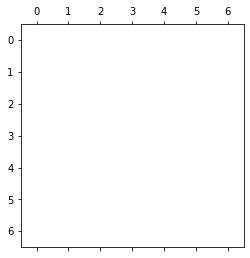

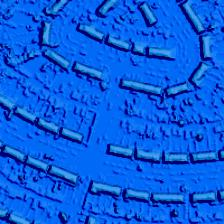

picture 15223


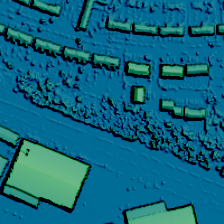

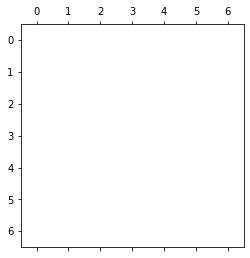

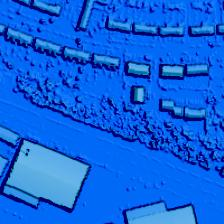

picture 15224


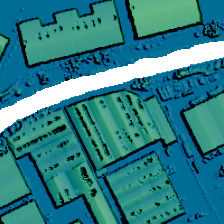

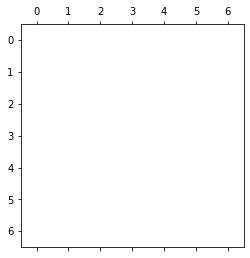

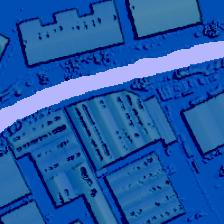

picture 15225


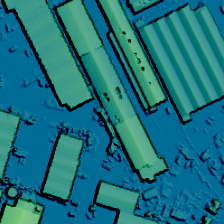

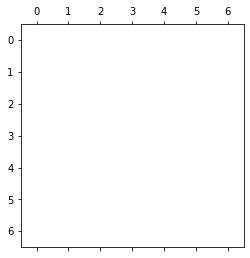

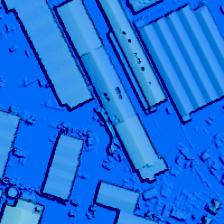

picture 15226


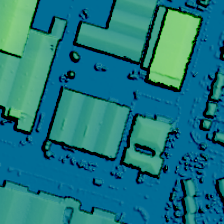

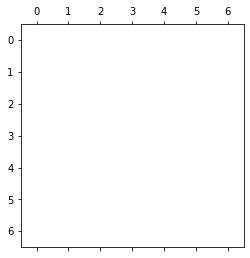

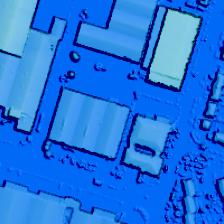

picture 15227


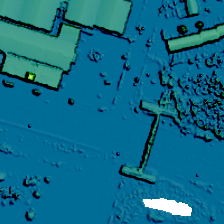

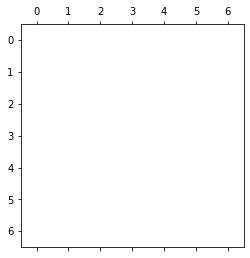

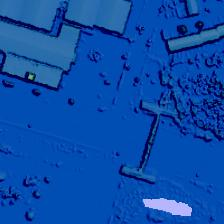

picture 15228


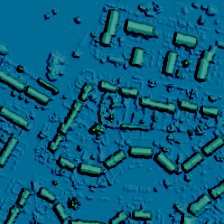

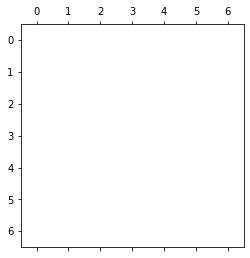

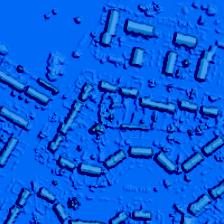

picture 15229


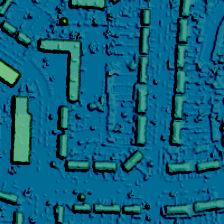

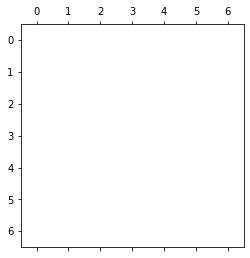

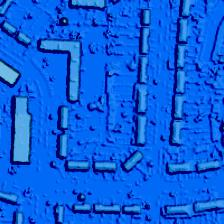

picture 15230


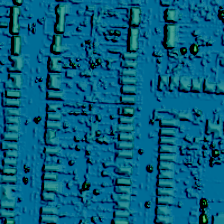

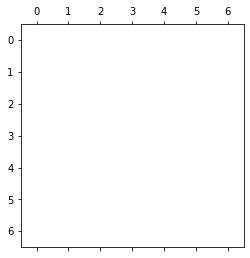

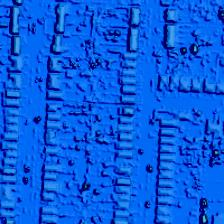

picture 15231


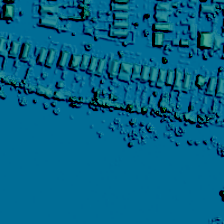

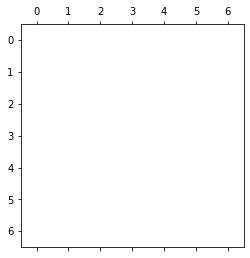

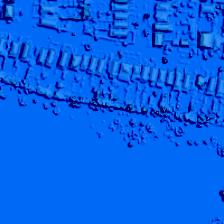

picture 15232


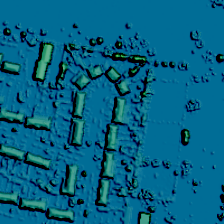

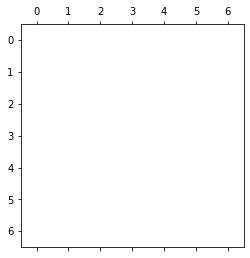

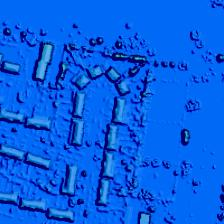

picture 15233


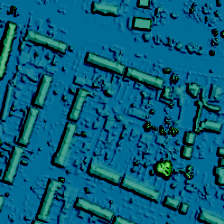

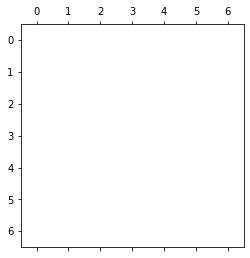

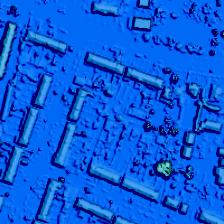

picture 15234


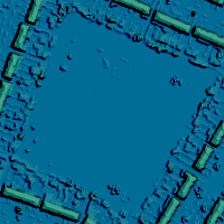

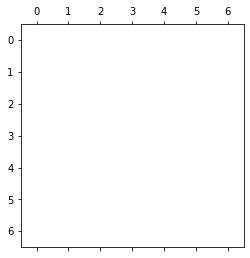

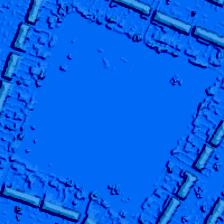

picture 15235


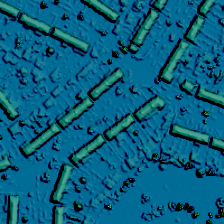

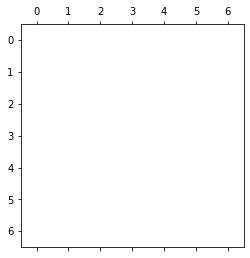

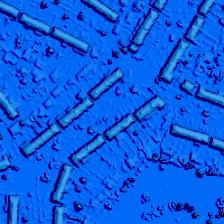

picture 15236


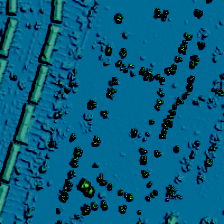

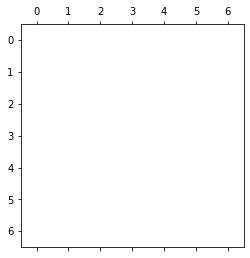

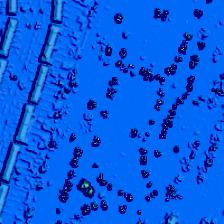

picture 15237


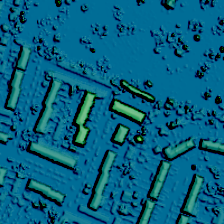

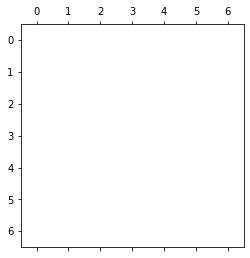

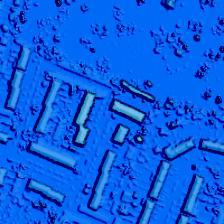

picture 15238


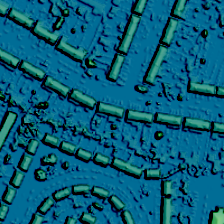

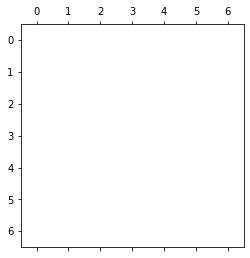

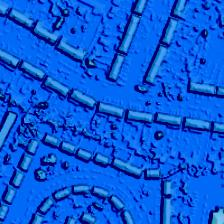

picture 15239


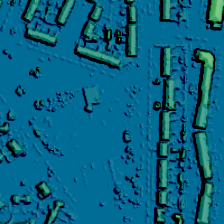

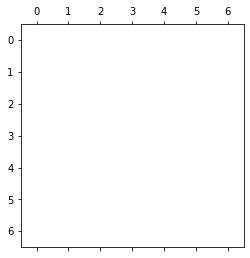

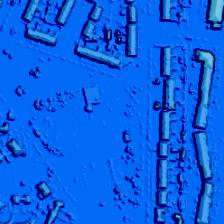

picture 15240


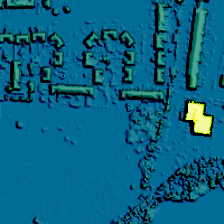

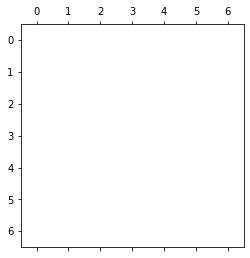

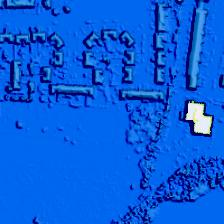

picture 15241


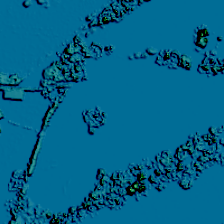

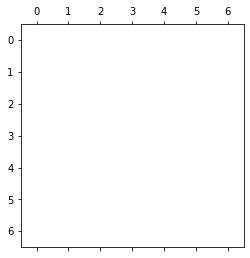

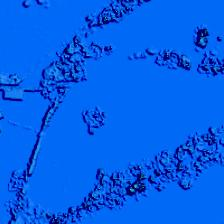

picture 15242


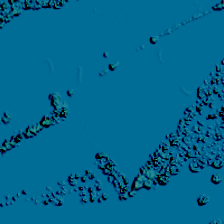

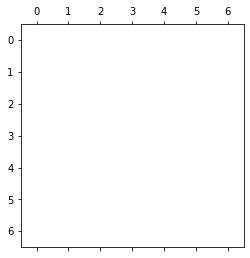

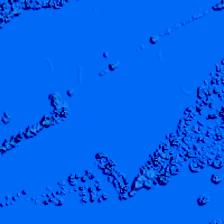

picture 15243


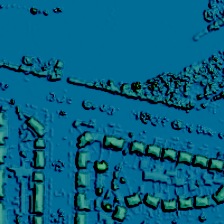

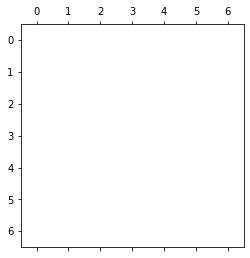

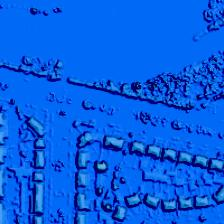

picture 15244


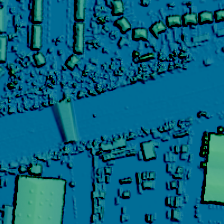

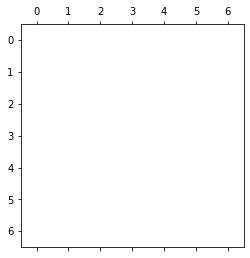

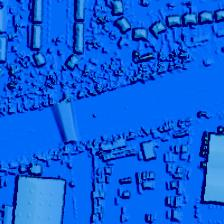

picture 15245


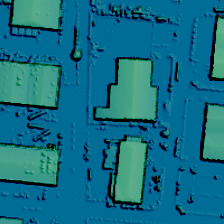

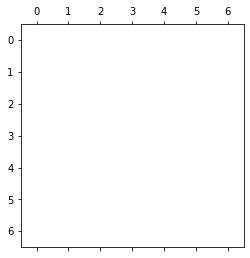

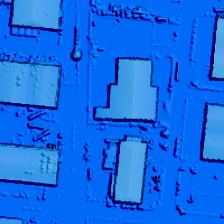

picture 15246


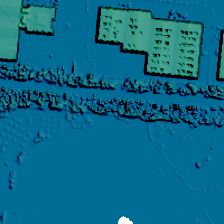

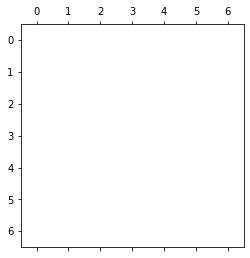

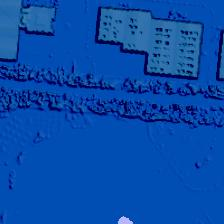

picture 15247


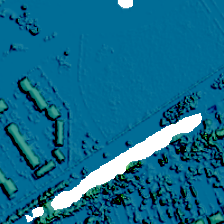

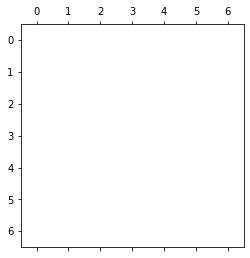

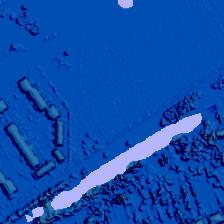

picture 15248


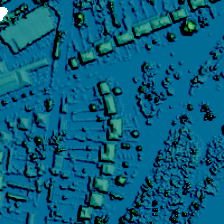

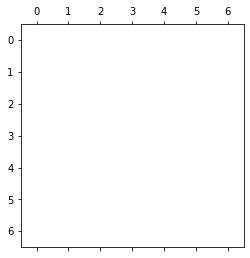

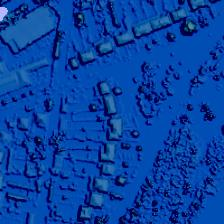

picture 15249


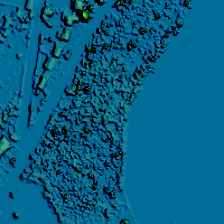

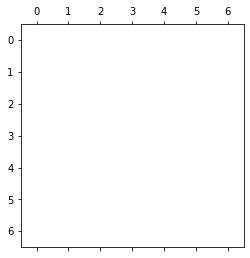

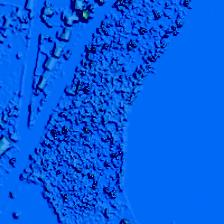

picture 15250


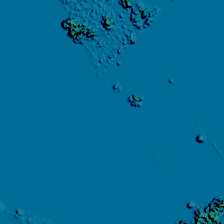

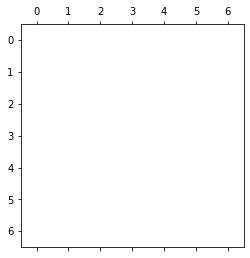

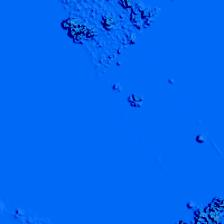

picture 15251


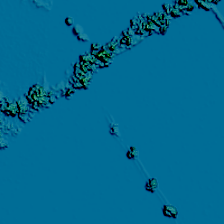

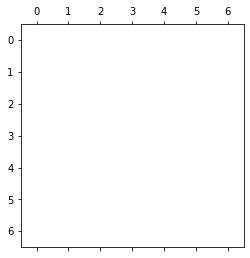

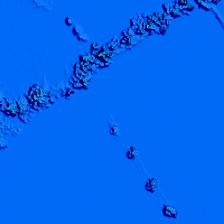

picture 15252


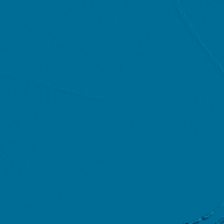

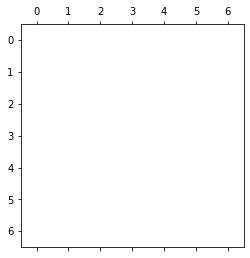

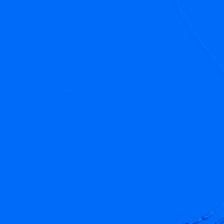

picture 15253


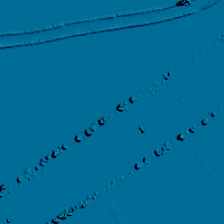

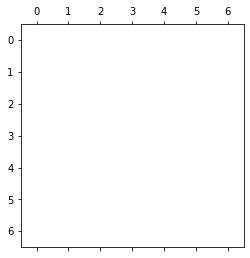

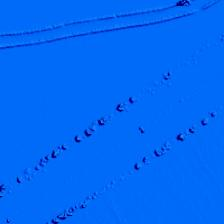

picture 15254


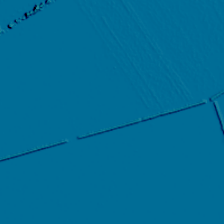

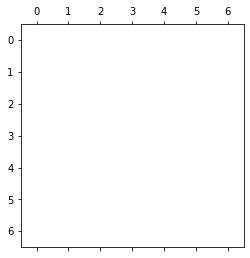

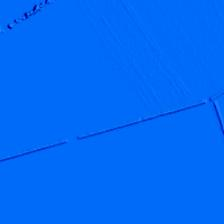

picture 15255


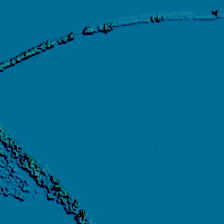

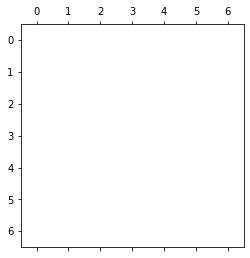

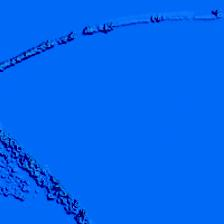

picture 15256


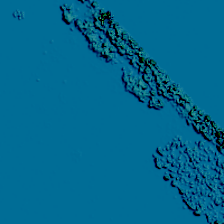

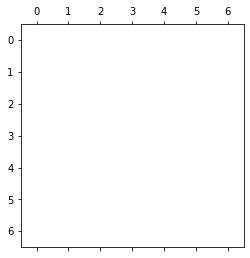

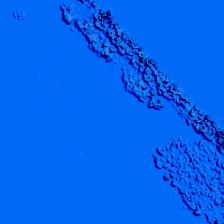

picture 15257


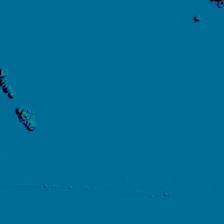

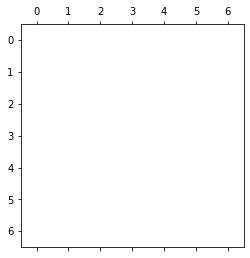

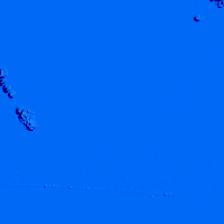

picture 15258


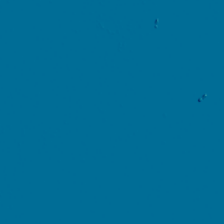

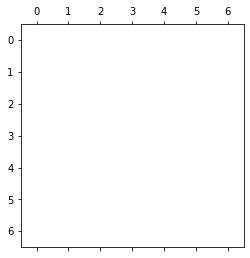

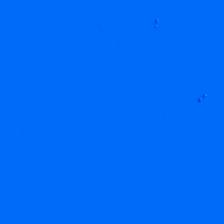

picture 15259


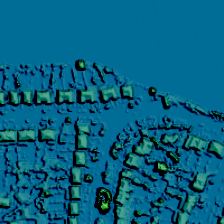

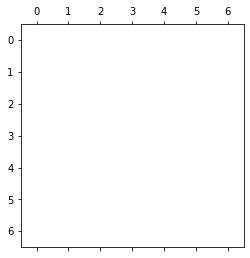

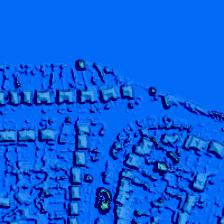

picture 15260


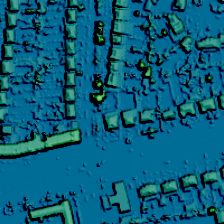

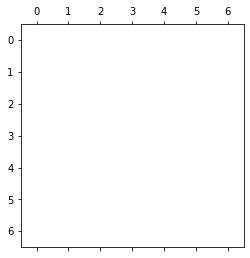

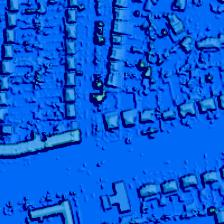

picture 15261


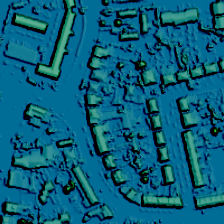

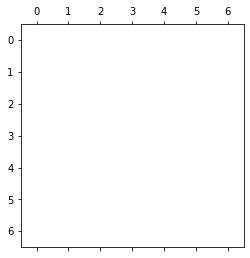

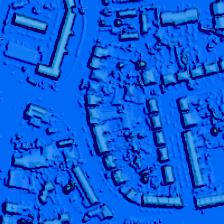

picture 15262


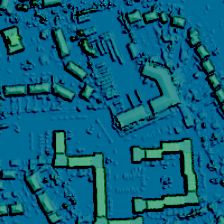

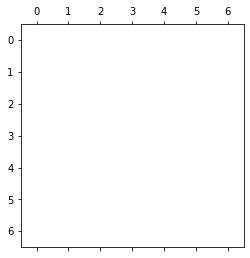

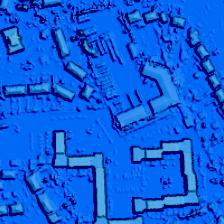

picture 15263


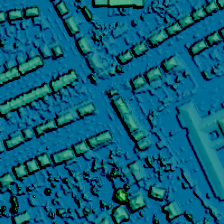

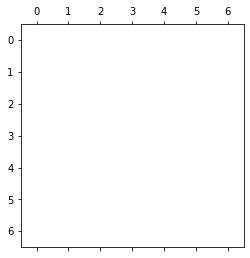

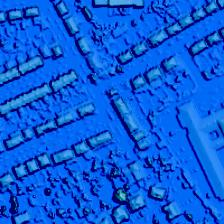

picture 15264


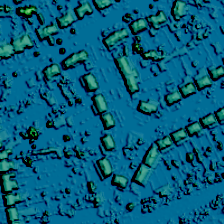

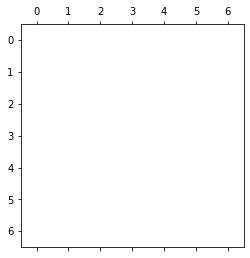

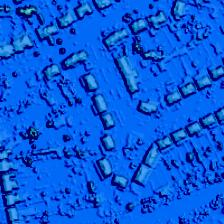

picture 15265


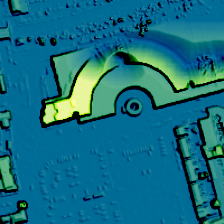

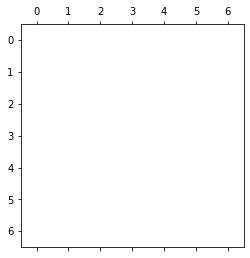

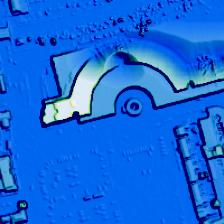

picture 15266


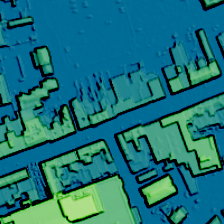

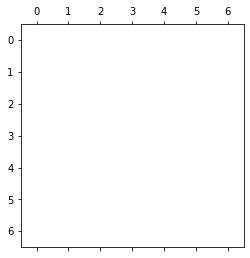

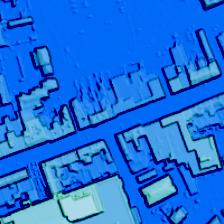

In [ ]:
for i in range(15207, 15267):
  print("picture", i)
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)

  # Plot it
  display(Image(img_path))
  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names)

# Display heatmap
  plt.matshow(heatmap)
  plt.show()

    # We load the original image
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "House_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad RAM
  display(Image(save_path))

Lower and medium

In [ ]:
for i in range(45207, 45267):
  print("picture", i)
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)

  # Plot it
  #display(Image(img_path))
  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names)

# Display heatmap
  #plt.matshow(heatmap)
  #plt.show()

    # We load the original image
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "House_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad RAM
  display(Image(save_path))



higher medium

In [ ]:
for i in range(45207, 45267):
  print("picture", i)
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)

  # Plot it
  display(Image(img_path))
  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names)

# Display heatmap
  plt.matshow(heatmap)
  plt.show()

    # We load the original image
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "House_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad RAM
  display(Image(save_path))

High

In [ ]:
for i in range(44207, 44267):
  print("picture", i)
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)

  # Plot it
  #display(Image(img_path))
  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names)

# Display heatmap
  #plt.matshow(heatmap)
  #plt.show()

    # We load the original image
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "House_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad RAM
  display(Image(save_path))



Group 1 predict

picture 15207
[[2.0597014]]


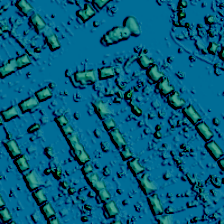

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:452: UserWarning: Warning: converting a masked element to nan.
  dv = np.float64(self.norm.vmax) - np.float64(self.norm.vmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:459: UserWarning: Warning: converting a masked element to nan.
  a_min = np.float64(newmin)
/usr/local/lib/python3.7/dist-packages/matplotlib/image.py:464: UserWarning: Warning: converting a masked element to nan.
  a_max = np.float64(newmax)
<string>:6: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)


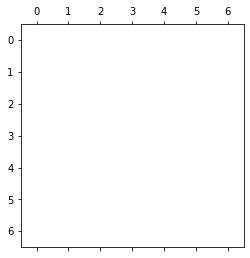

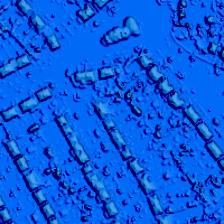

picture 15208
[[1.9398602]]


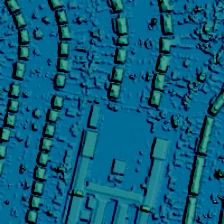

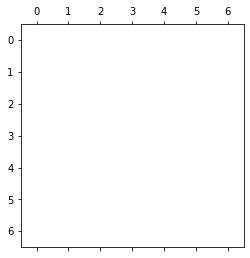

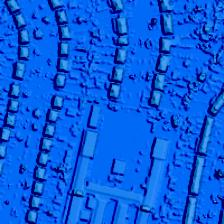

picture 15209
[[1.97113]]


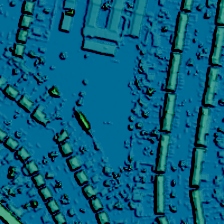

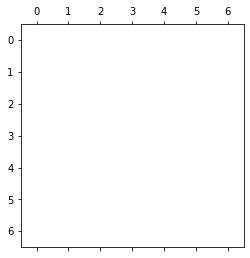

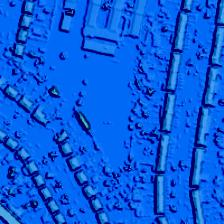

picture 15210
[[2.0015445]]


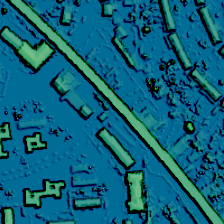

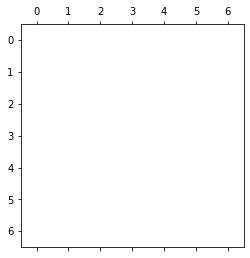

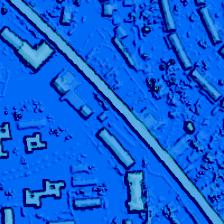

picture 15211
[[2.0412755]]


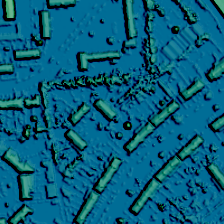

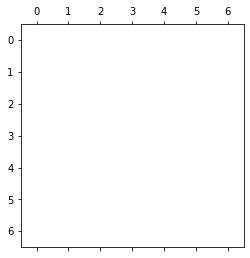

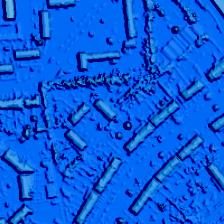

picture 15212
[[1.9594376]]


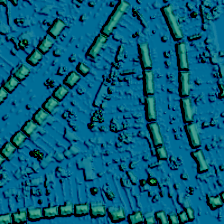

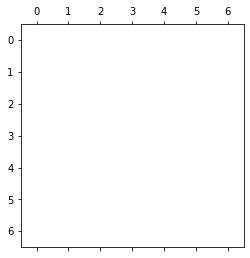

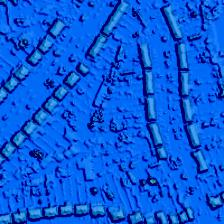

picture 15213
[[1.9272053]]


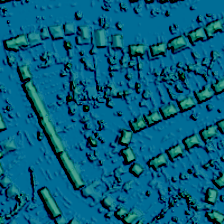

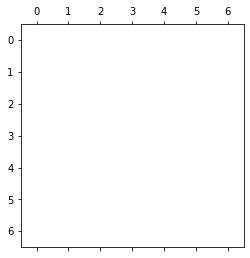

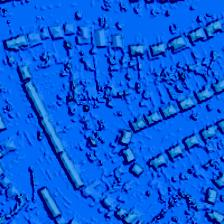

picture 15214
[[2.0505354]]


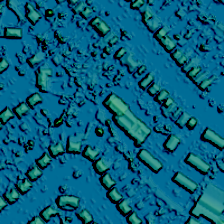

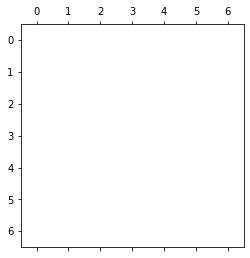

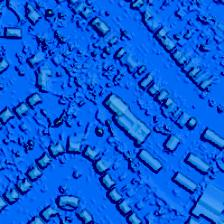

picture 15215
[[2.0745091]]


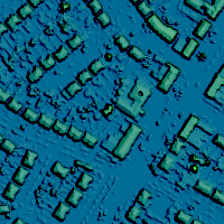

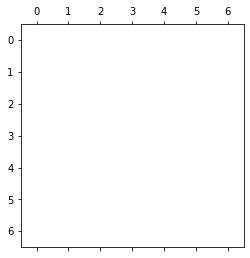

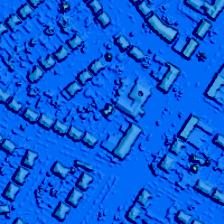

picture 15216
[[2.1404939]]


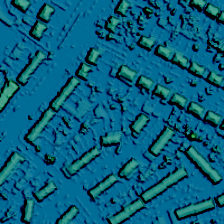

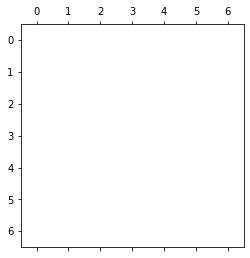

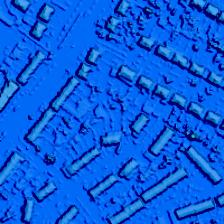

picture 15217
[[1.9292823]]


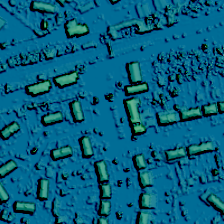

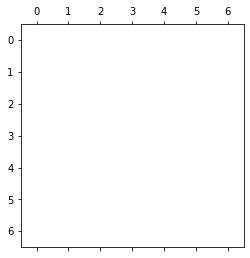

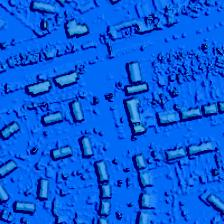

picture 15218
[[1.9564556]]


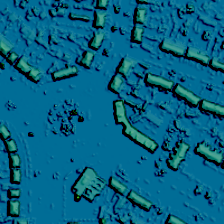

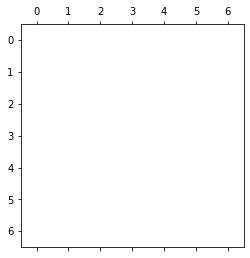

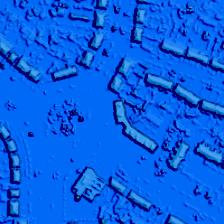

picture 15219
[[2.0384457]]


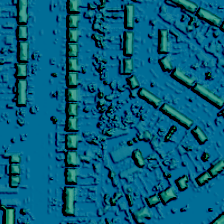

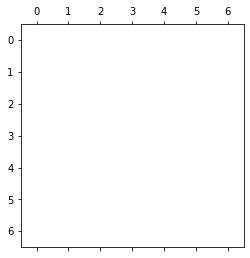

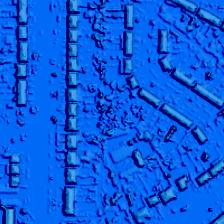

picture 15220
[[2.1019795]]


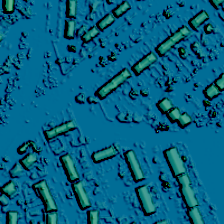

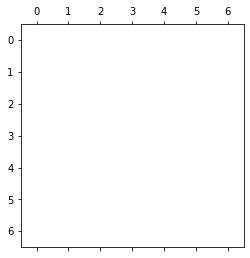

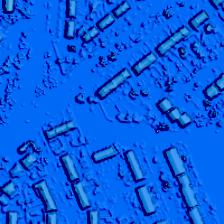

picture 15221
[[2.1616514]]


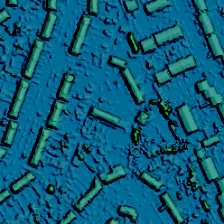

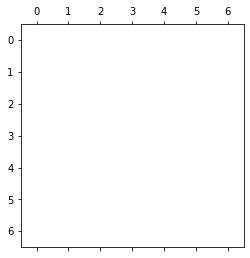

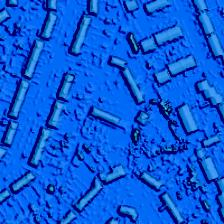

picture 15222
[[1.9511364]]


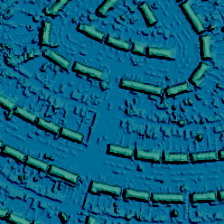

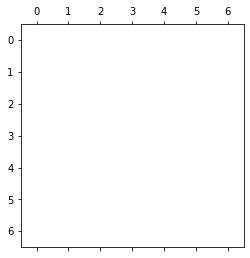

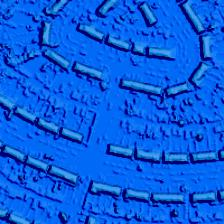

picture 15223
[[1.9964213]]


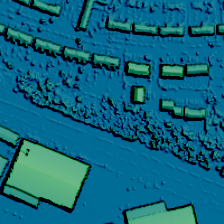

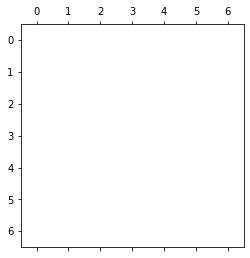

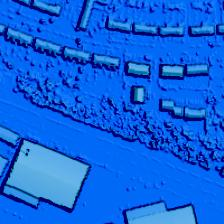

picture 15224
[[2.1360786]]


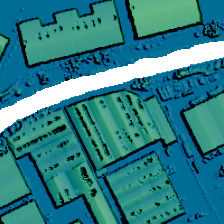

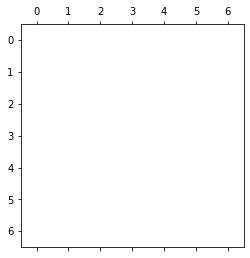

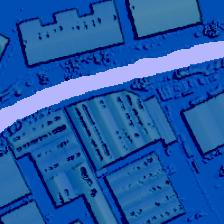

picture 15225
[[2.1079144]]


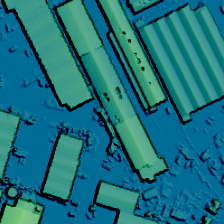

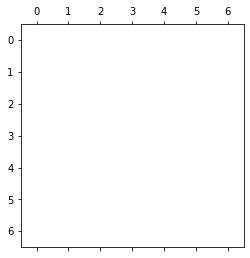

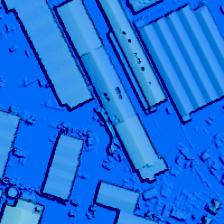

picture 15226
[[2.302248]]


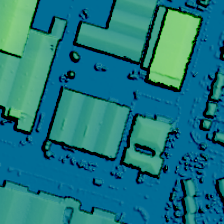

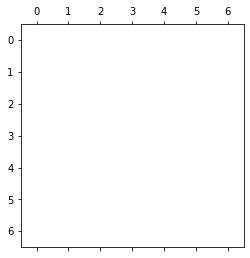

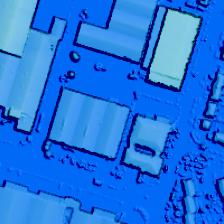

picture 15227
[[1.9644948]]


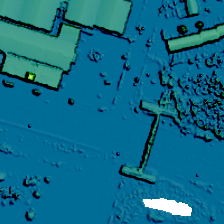

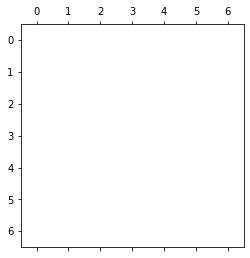

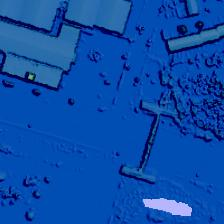

picture 15228
[[1.9223735]]


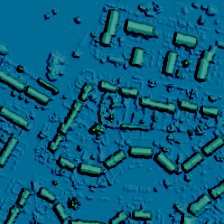

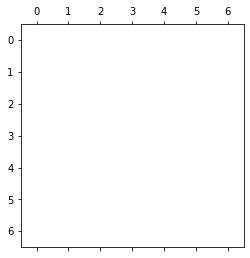

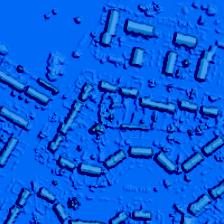

picture 15229
[[1.9611712]]


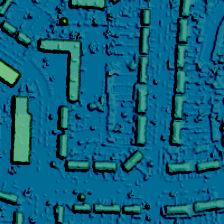

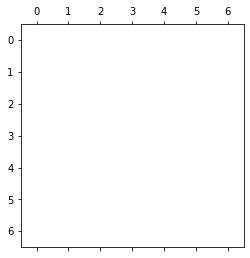

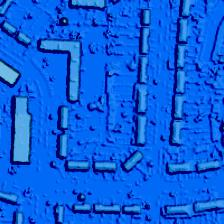

picture 15230
[[1.950989]]


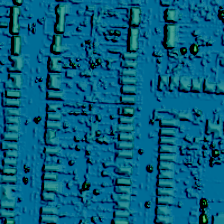

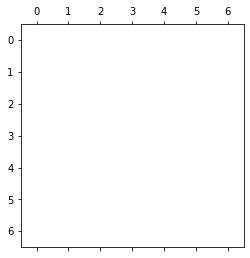

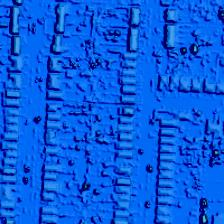

picture 15231
[[2.0394027]]


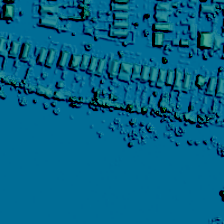

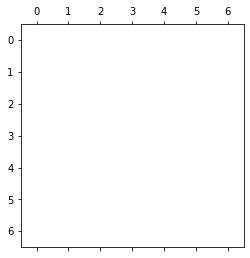

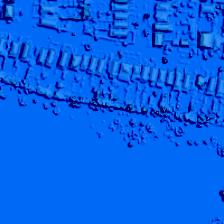

picture 15232
[[2.0121574]]


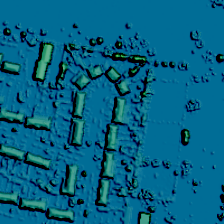

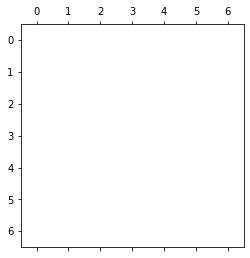

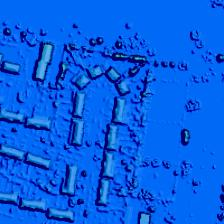

picture 15233
[[2.0200303]]


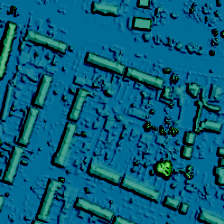

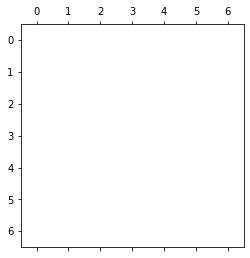

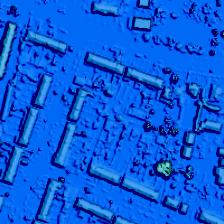

picture 15234
[[2.0678475]]


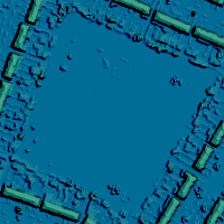

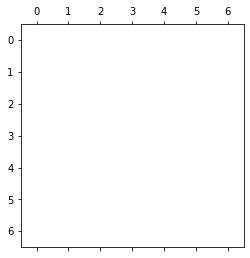

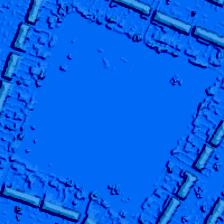

picture 15235
[[2.1324368]]


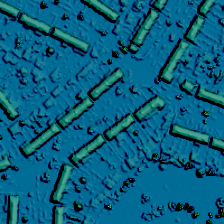

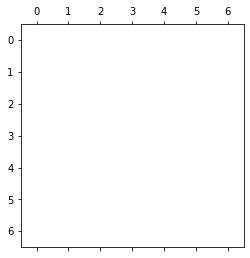

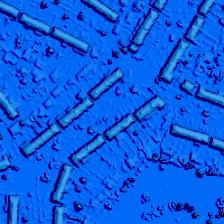

picture 15236
[[2.009704]]


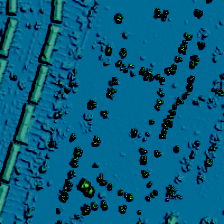

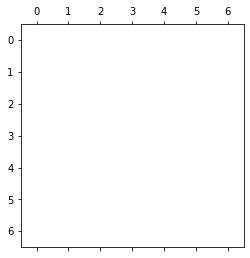

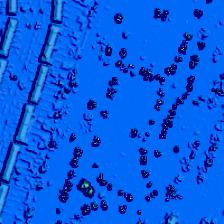

picture 15237
[[1.9848967]]


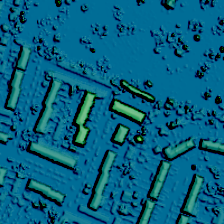

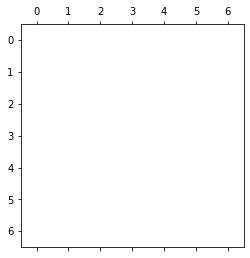

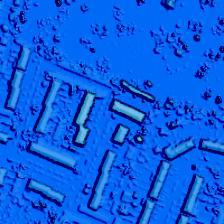

picture 15238
[[2.041241]]


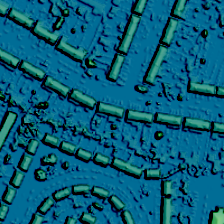

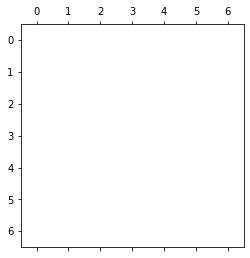

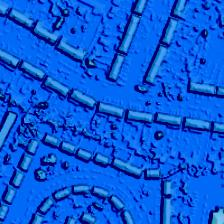

picture 15239
[[1.9565147]]


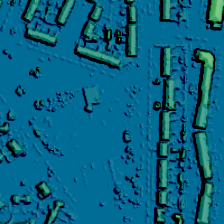

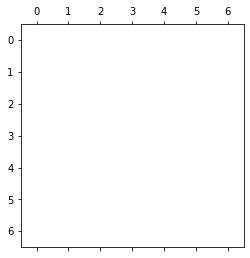

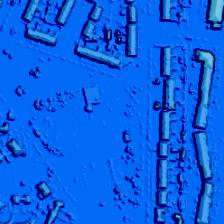

picture 15240
[[2.0089722]]


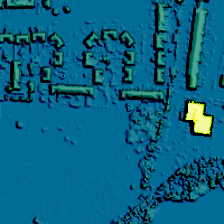

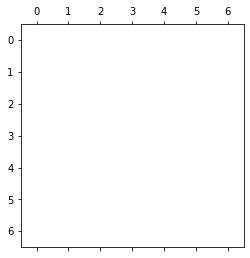

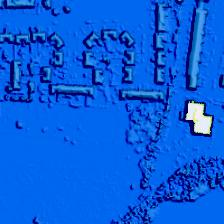

picture 15241
[[1.9887853]]


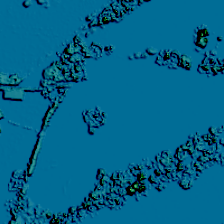

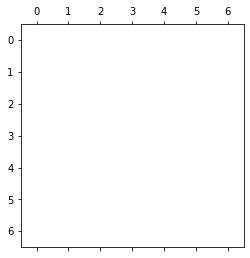

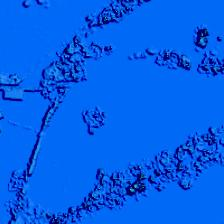

picture 15242
[[1.9919422]]


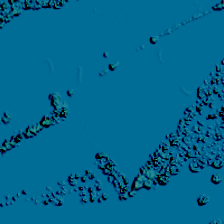

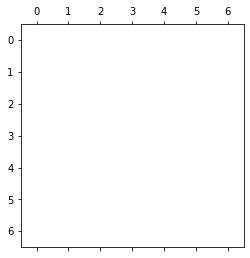

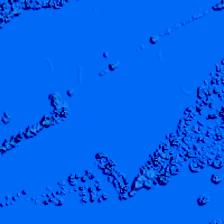

picture 15243
[[1.9948041]]


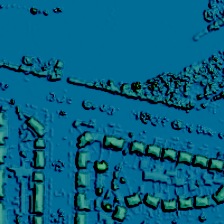

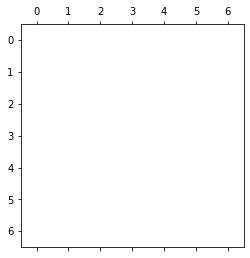

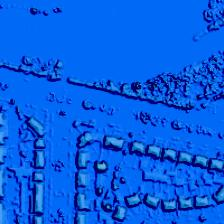

picture 15244
[[1.9209095]]


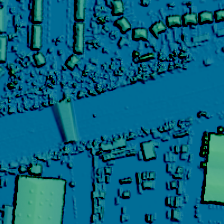

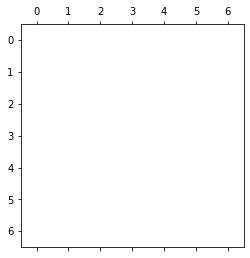

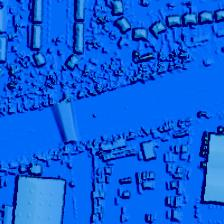

picture 15245
[[1.8851715]]


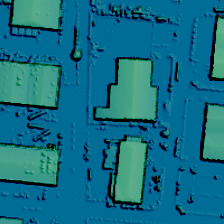

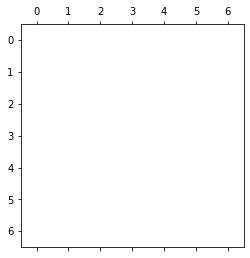

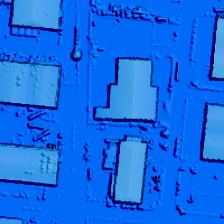

picture 15246
[[2.0274434]]


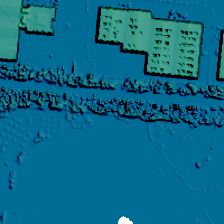

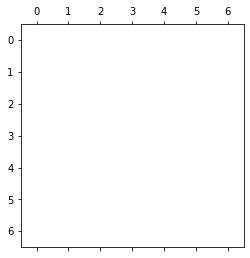

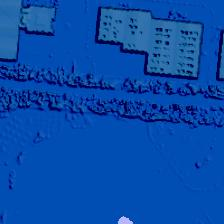

picture 15247
[[2.6384234]]


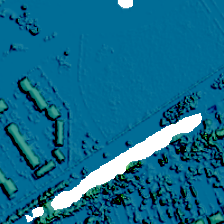

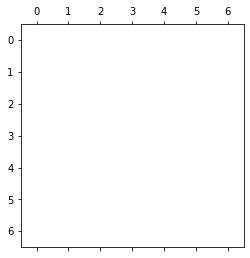

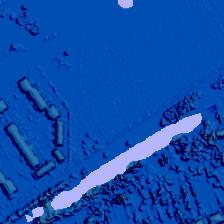

picture 15248
[[1.9646374]]


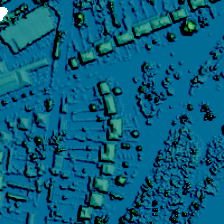

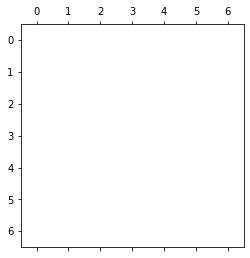

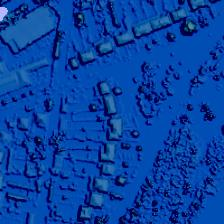

picture 15249
[[2.0907266]]


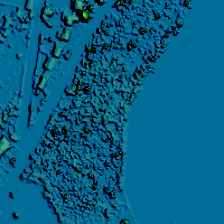

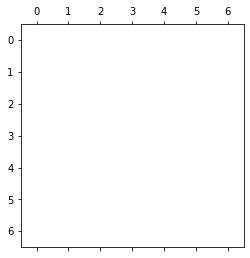

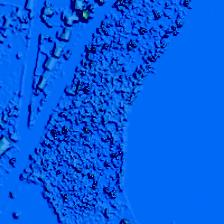

picture 15250
[[1.997561]]


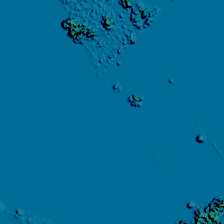

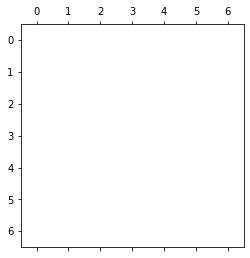

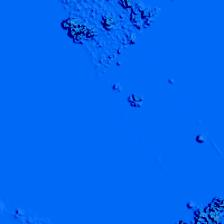

picture 15251
[[1.9949046]]


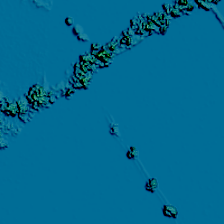

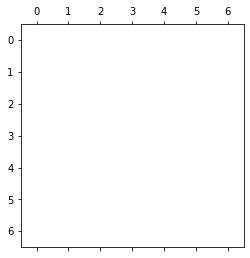

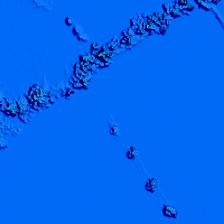

picture 15252
[[1.9955071]]


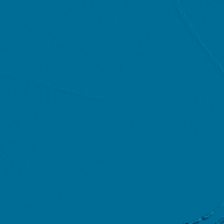

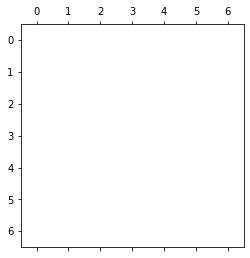

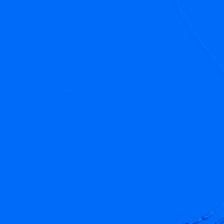

picture 15253
[[1.9805717]]


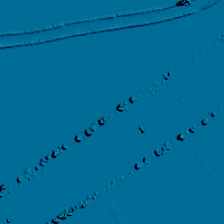

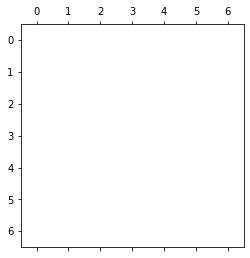

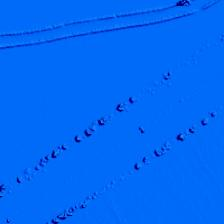

picture 15254
[[1.9786361]]


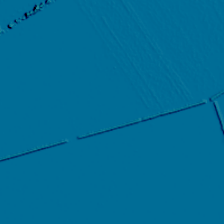

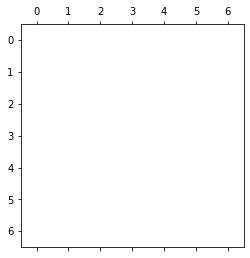

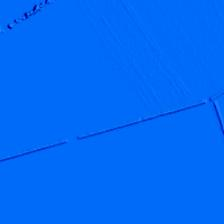

picture 15255
[[2.041832]]


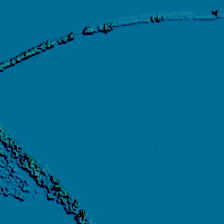

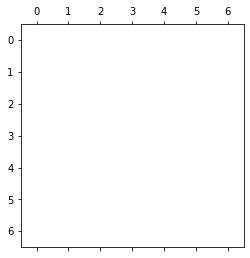

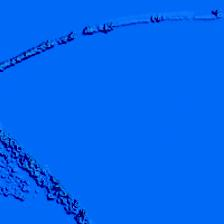

picture 15256
[[2.075139]]


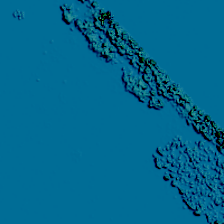

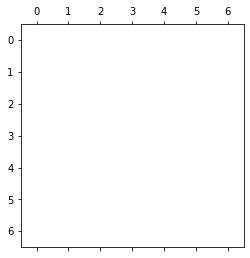

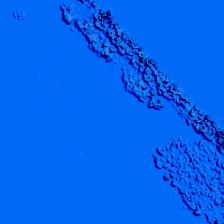

picture 15257
[[1.9923501]]


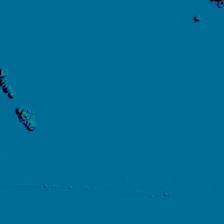

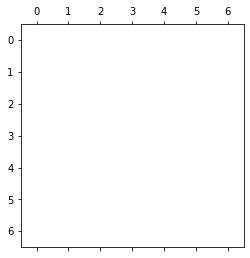

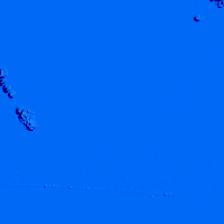

picture 15258
[[1.9974619]]


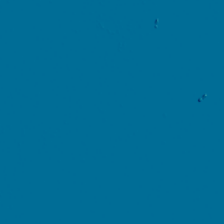

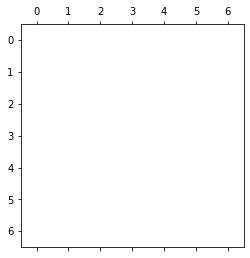

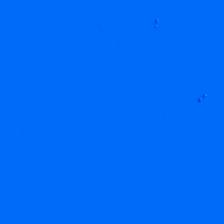

picture 15259
[[2.0158145]]


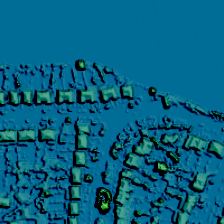

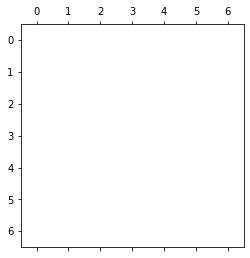

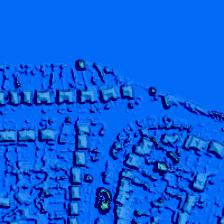

picture 15260
[[1.9617438]]


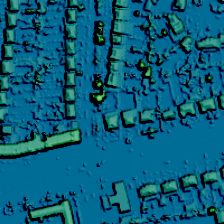

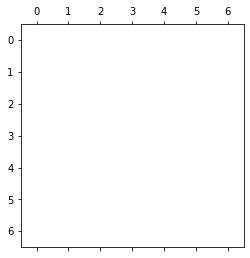

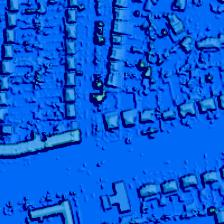

picture 15261
[[2.0258627]]


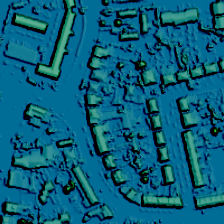

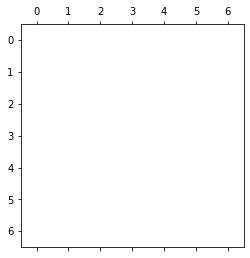

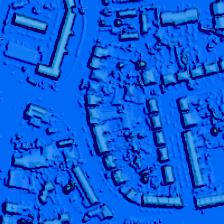

picture 15262
[[2.184449]]


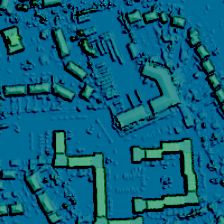

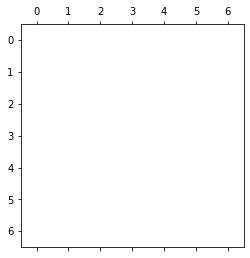

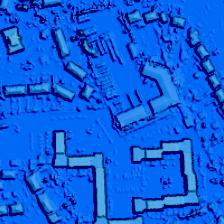

picture 15263
[[2.0353336]]


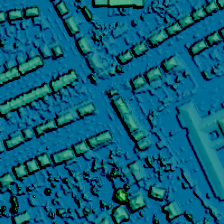

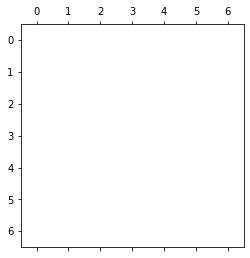

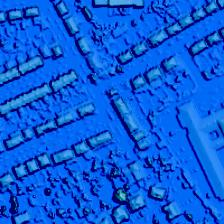

picture 15264
[[2.0016398]]


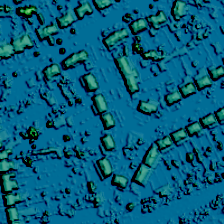

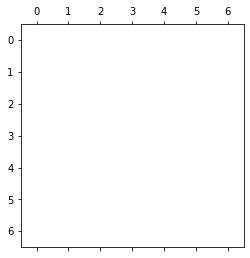

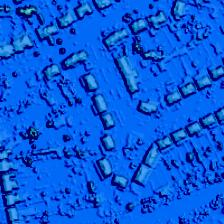

picture 15265
[[2.1538837]]


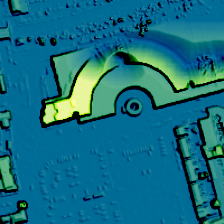

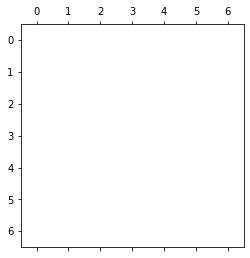

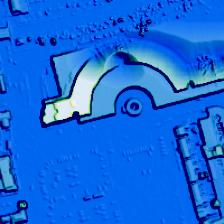

picture 15266
[[2.1370592]]


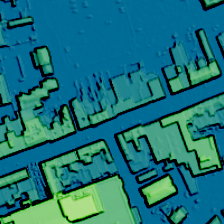

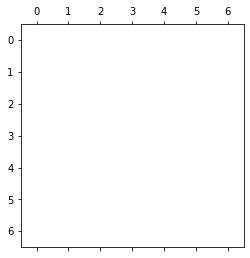

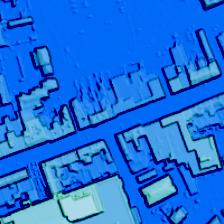

In [ ]:
for i in range(15207, 15267):
  img_path = 'LIDAR/LIDAR_17541.png'
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)
  preds = ImageOnlyModel.predict(preprocess_input(data))
  print("picture", i)
  print(preds)   
  
  # Plot it
  display(Image(img_path))

  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names
  )

  # Display heatmap
  plt.matshow(heatmap)
  plt.show()
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "HouseVGG_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad CAM
  display(Image(save_path))

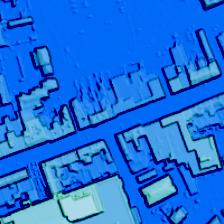

In [ ]:
# We load the original image
img = keras.preprocessing.image.load_img(img_path)
img = keras.preprocessing.image.img_to_array(img)

# We rescale heatmap to a range 0-255
heatmap = np.uint8(255 * heatmap)

# We use jet colormap to colorize heatmap
jet = cm.get_cmap("jet")

# We use RGB values of the colormap
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]

# We create an image with RGB colorized heatmap
jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

# Superimpose the heatmap on original image
superimposed_img = jet_heatmap * 0.4 + img
superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

# Save the superimposed image
save_path = "HouseVGG_Example.jpg"
superimposed_img.save(save_path)

# Display Grad CAM
display(Image(save_path))

Group 2 predict

In [ ]:
for i in range(45207, 45267):
  img_path = 'LIDAR/LIDAR_17541.png'
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)
  preds = ImageOnlyModel.predict(preprocess_input(data))
  print("picture", i)
  print(preds)   
  
  # Plot it
  display(Image(img_path))

  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names
  )


  # Display heatmap
  plt.matshow(heatmap)
  plt.show()
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "HouseVGG_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad CAM
  display(Image(save_path))

In [ ]:
for  i in range(44207, 44267):
  img_path = 'LIDAR/LIDAR_17541.png'
  img_path = os.path.join(ImagePath, 'LIDAR_' + str(i) + '.png')
  data = get_img_array(img_path)
  preds = ImageOnlyModel.predict(preprocess_input(data))
  print("picture", i)
  print(preds)   
  
  # Plot it
  display(Image(img_path))

  heatmap = make_gradcam_heatmap(
    preprocess_input(data), ImageOnlyModel, last_conv_layer_name, classifier_layer_names
  )

  # Display heatmap
  plt.matshow(heatmap)
  plt.show()
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # We rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # We use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # We use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # We create an image with RGB colorized heatmap
  jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * 0.4 + img
  superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

  # Save the superimposed image
  save_path = "HouseVGG_Example.jpg"
  superimposed_img.save(save_path)

  # Display Grad CAM
  display(Image(save_path))